In [1]:
import functions as fct
import importlib
from datetime import datetime
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import folium
from folium.features import DivIcon
from obspy.clients.fdsn import Client


In [2]:
importlib.reload(fct)

<module 'functions' from 'C:\\Users\\User\\Documents\\Cours\\Stage\\functions.py'>

In [3]:
psd_p_19 , dates_p_19, freqs_p_19 = fct.load_psd("PSD_PII_2019-1-1_2019-12-31_RR.npz")


# METADONNEES SISMOLOGIQUES

In [29]:
lat_virgo = 43.63
lg_virgo = 10.5
client = Client("INGV")
inventory = client.get_stations(latitude=lat_virgo, longitude=lg_virgo, minradius=0, maxradius=0.1, level="channel")
print(inventory)

Inventory created at 2026-08-10T17:03:15.696000Z
	Created by: INGV-ONT WEB SERVICE: fdsnws-station | version: 1.1.64
		    /exist/apps/fdsn-station/fdsnws/station/1/query?level=channel&latit...
	Sending institution: eXistDB (INGV-ONT)
	Contains:
		Networks (2):
			IV, VR
		Stations (4):
			IV.PII (PISA)
			VR.VRG01 (Virgo Central Building)
			VR.VRG02 (Virgo North End Building)
			VR.VRG03 (Virgo West End Building)
		Channels (17):
			IV.PII..HHZ (2x), IV.PII..HHN (2x), IV.PII..HHE (2x), 
			IV.PII..SHZ (2x), VR.VRG01..HH1, VR.VRG01..HH2, VR.VRG01..HH3, 
			VR.VRG02..HH1, VR.VRG02..HH2, VR.VRG02..HH3, VR.VRG03..HH1, 
			VR.VRG03..HH2, VR.VRG03..HH3


In [28]:
stations_map = folium.Map(location=[lat_virgo,lg_virgo], zoom_start=11)
for network in inventory.networks:
    for station in network.stations:
        folium.Marker(location=[station.latitude, station.longitude], tooltip=f"{network.code}.{station.code}").add_to(stations_map)


stations_map = folium.Map(
    location=[lat_virgo+0.04, lg_virgo],
    zoom_start=12    ,control_scale=True

)

for network in inventory.networks:
    for station in network.stations:

        label = f"{network.code}.{station.code}"
        folium.Marker(location=[station.latitude, station.longitude], tooltip=f"{network.code}.{station.code}").add_to(stations_map)

        folium.Marker(
            location=[station.latitude, station.longitude-0.01],
            icon=DivIcon(
                icon_size=(150, 36),
                icon_anchor=(0, 0),
                html=f"""
                <div style="
                    font-size: 15px;
                    font-weight: bold;
                    color: black;
                    white-space: nowrap;
                ">
                    {label}
                </div>
                """
            )
        ).add_to(stations_map)


stations_map


# COMPARAISON VRG01 vs PII

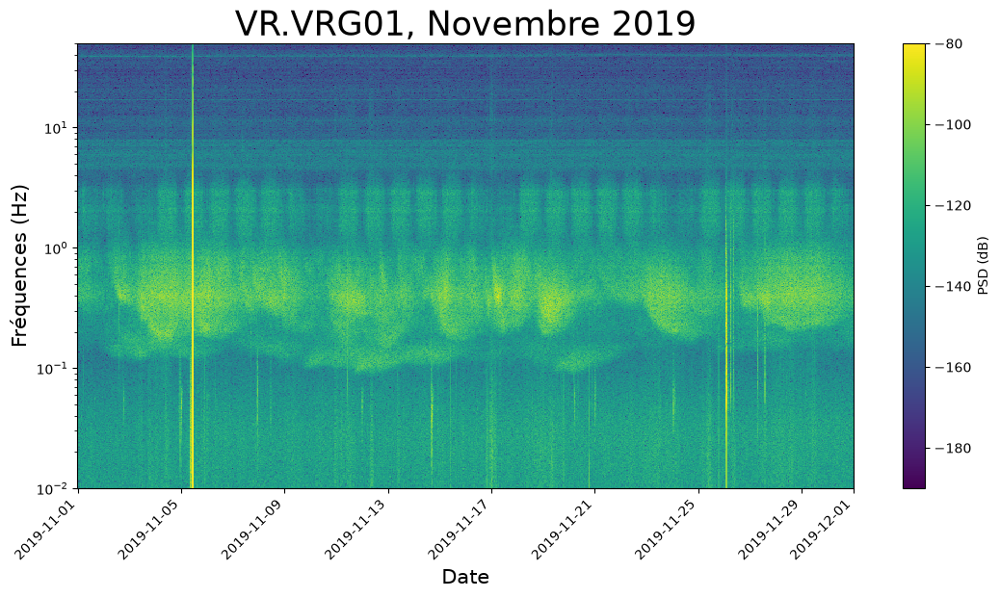

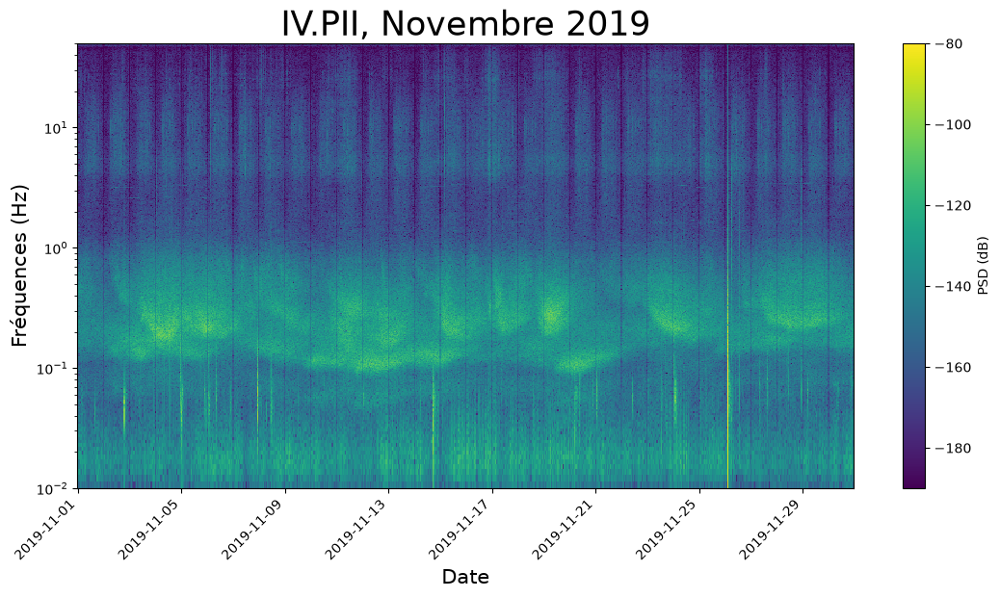

In [3]:
psd_19 , dates_19, freqs_19 = fct.load_psd("PSD_VRG01_2019.npz")
fct.spec_plot(psd_19 , dates_19, freqs_19, title = "VR.VRG01, Novembre 2019",limx=(datetime(2019,11,1),datetime(2019,12,1)),outfile="spec_vrg")

fct.spec_plot(psd_p_19 , dates_p_19, freqs_p_19, title = "IV.PII, Novembre 2019",limx=(datetime(2019,11,1),datetime(2019,12,1)),outfile="spec_pii")

# ANALYSE PAR RUN

In [5]:
data = pd.read_pickle("data_V1.pkl")


In [6]:
start_O2 = datetime(2016,11,30)
end_O2 = datetime(2017,8,25)

mask_O2 = (data["date"] >= start_O2) & (data["date"] <= end_O2)
O2_data = data[mask_O2]

start_O3a = datetime(2019,4,1)
end_O3a = datetime(2019,10,1)

mask_O3a = (data["date"] >= start_O3a) & (data["date"] <= end_O3a)
O3a_data = data[mask_O3a]

start_O3b = datetime(2019,11,11)
end_O3b = datetime(2020,3,27)

mask_O3b = (data["date"] >= start_O3b) & (data["date"] <= end_O3b)
O3b_data = data[mask_O3b]

start_O4a = pd.Timestamp(2023,5,24)
end_O4a = pd.Timestamp(2024,1,16)

mask_O4a = (data["date"] >= start_O4a) & (data["date"] <= end_O4a)

O4a_data = data[mask_O4a]

start_O4b = pd.Timestamp("2024-04-10")
end_O4b = pd.Timestamp("2025-01-28")

mask_O4b = (data["date"] >= start_O4b) & (data["date"] <= end_O4b)
O4b_data = data[mask_O4b]

Il y a 4 évenements pendant la journée et 1 événements pendant la nuit.
Rapport jour/nuit : 4.0


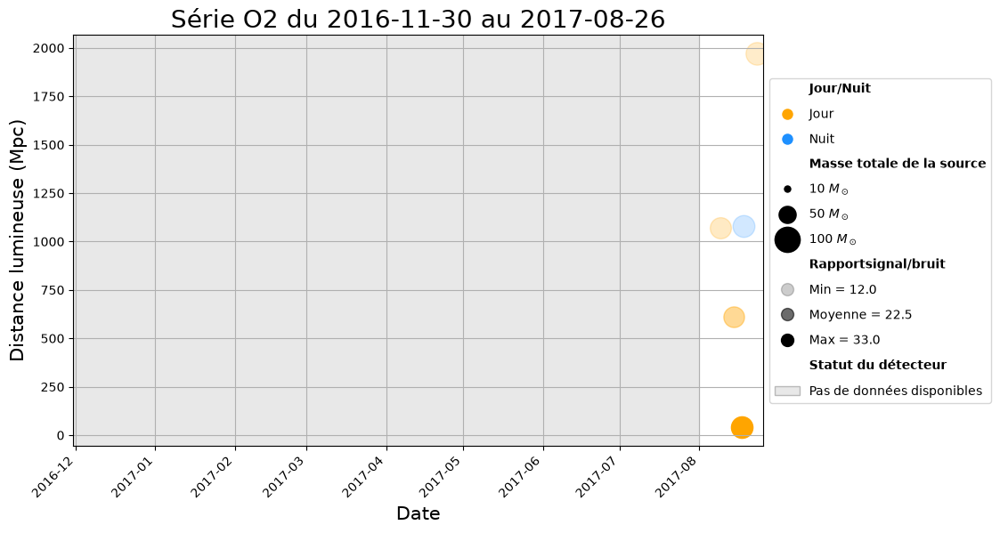

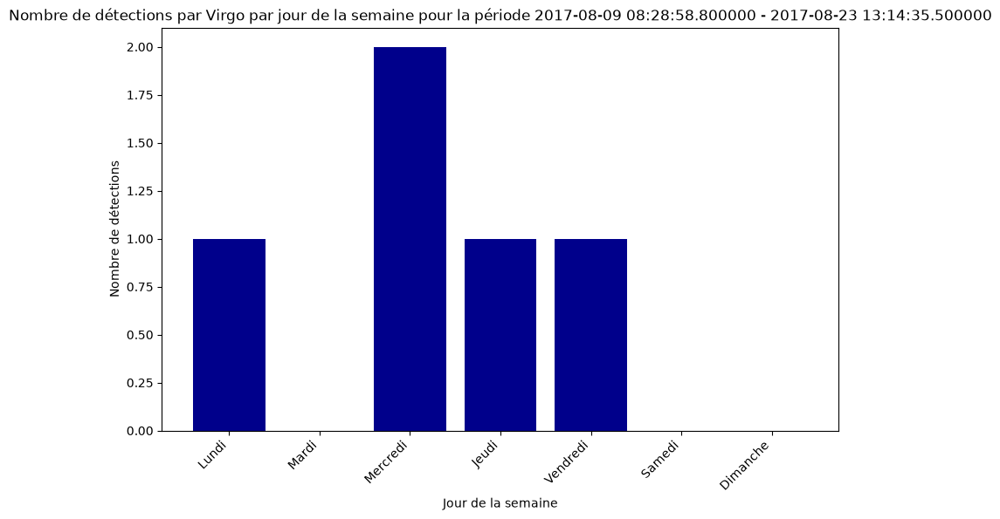

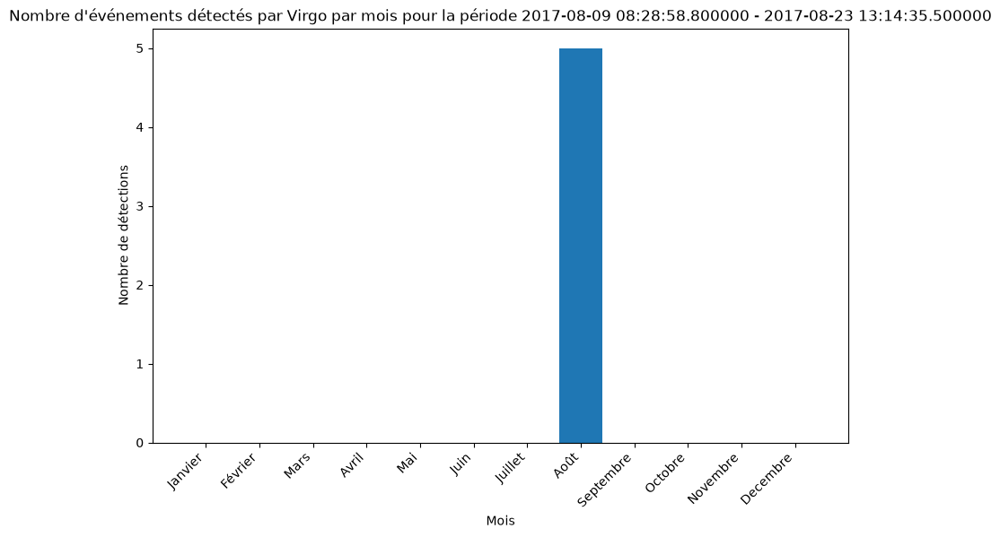

In [8]:
#O2

fct.day_night_ratio(O2_data)
fct.plot_events(O2_data,"O2",offline_periods=[(start_O2,datetime(2017,8,1))], lim = (start_O2,end_O2+ pd.Timedelta(days=1)),outfile = "O2")
fct.plot_days(O2_data)
fct.plot_months(O2_data)
#fct.plot_rate(O2_data)

Il y a 12 évenements pendant la journée et 20 événements pendant la nuit.
Rapport jour/nuit : 0.6


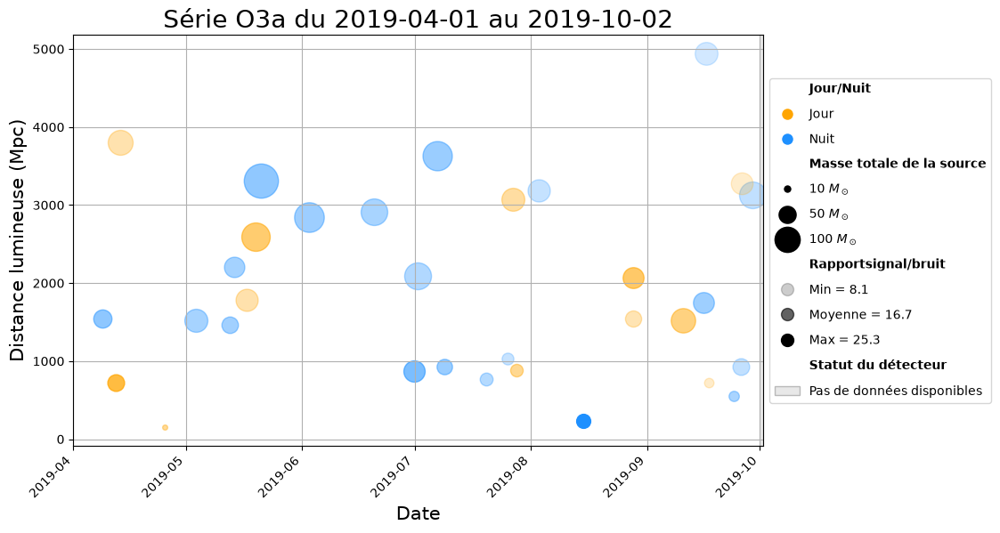

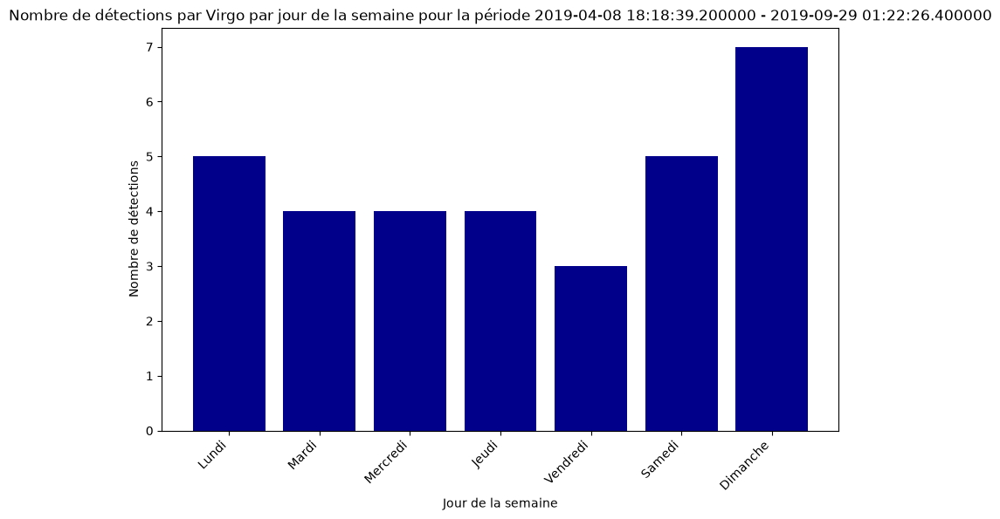

In [12]:
#O3a

fct.day_night_ratio(O3a_data)
fct.plot_events(O3a_data,"O3a",offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim = (start_O3a,end_O3a+ pd.Timedelta(days=1)),outfile = "O3a")
fct.plot_days(O3a_data)
#fct.plot_rate(O3a_data)

Il y a 13 évenements pendant la journée et 10 événements pendant la nuit.
Rapport jour/nuit : 1.3


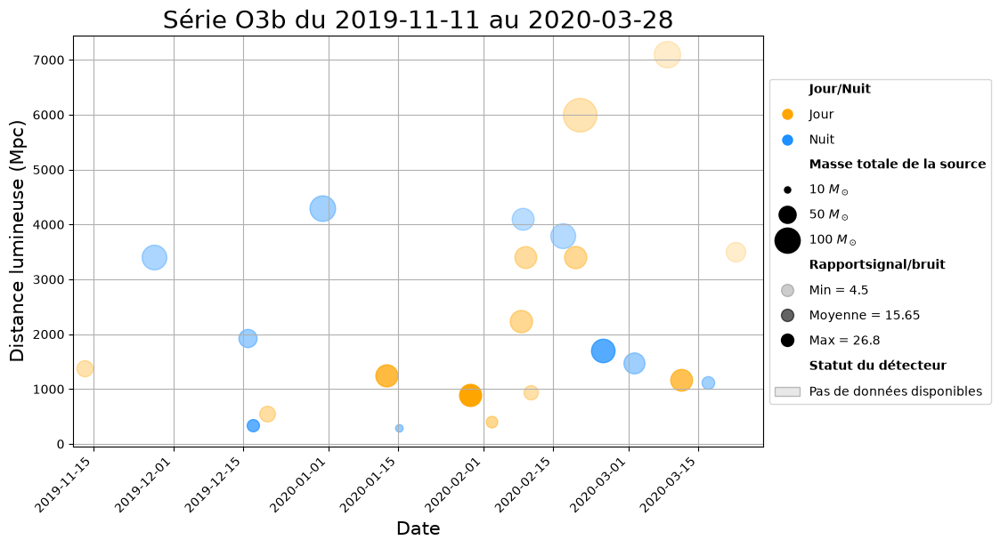

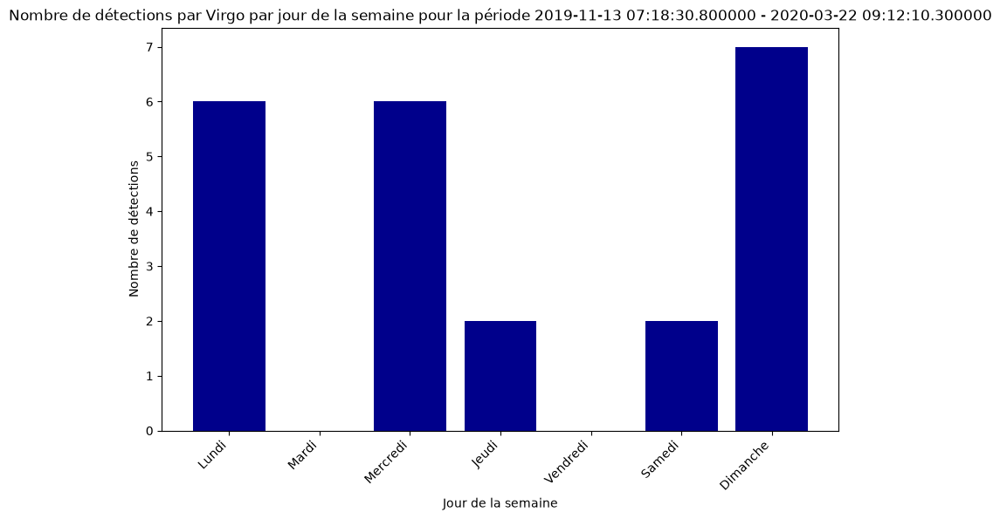

In [13]:
#O3b

fct.day_night_ratio(O3b_data)
fct.plot_events(O3b_data,"O3b",offline_periods= [(datetime(2020,3,28),datetime(2020,12,31))], lim = (start_O3b,end_O3b+ pd.Timedelta(days=1)),outfile = "O3b")
fct.plot_days(O3b_data)
#fct.plot_rate(O3b_data)

Il y a 0 évenements pendant la journée et 0 événements pendant la nuit.


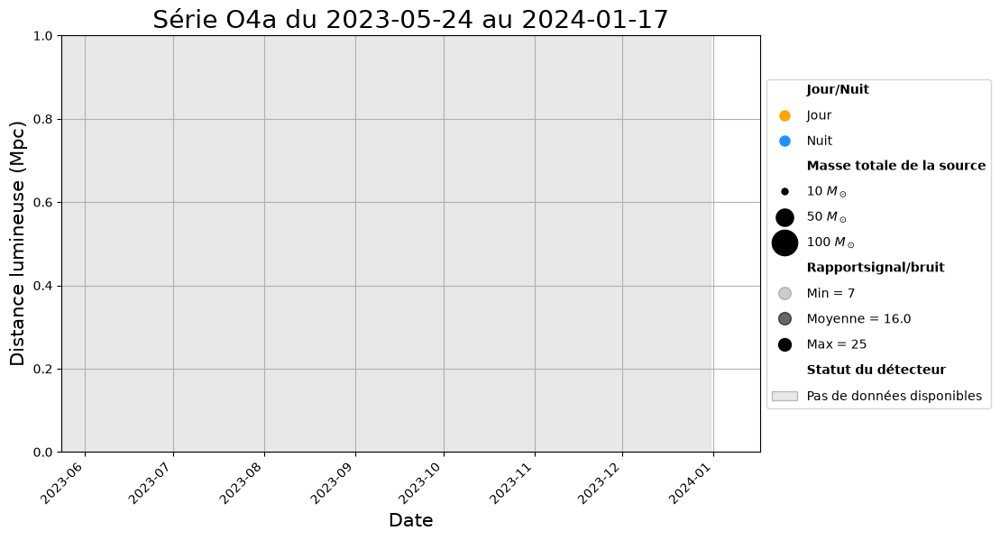

In [14]:
#O4a

fct.day_night_ratio(O4a_data)
fct.plot_events(O4a_data,"O4a",offline_periods=[(datetime(2023,1,1),datetime(2023,12,31))], lim = (start_O4a,end_O4a+ pd.Timedelta(days=1)),outfile = "O4a")


Il y a 60 évenements pendant la journée et 84 événements pendant la nuit.
Rapport jour/nuit : 0.7142857142857143


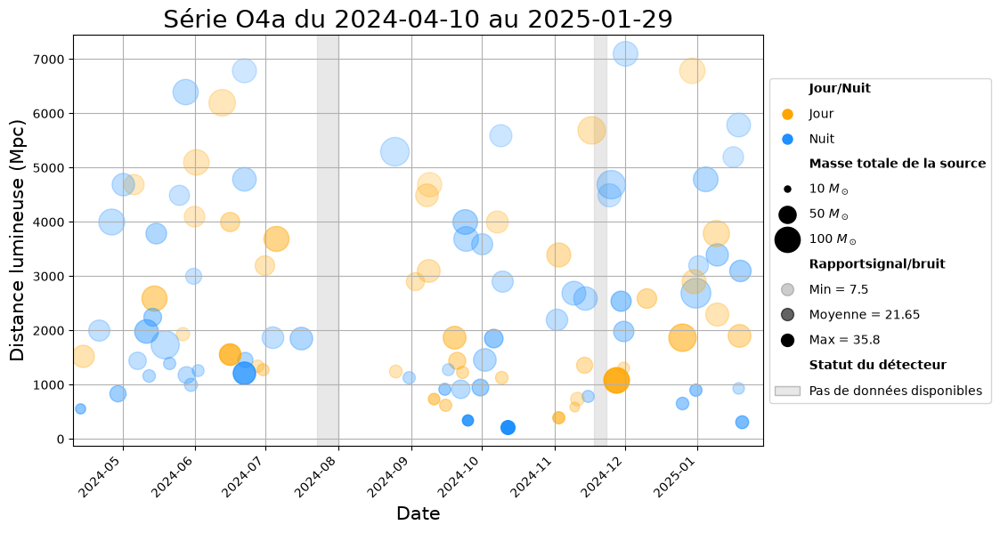

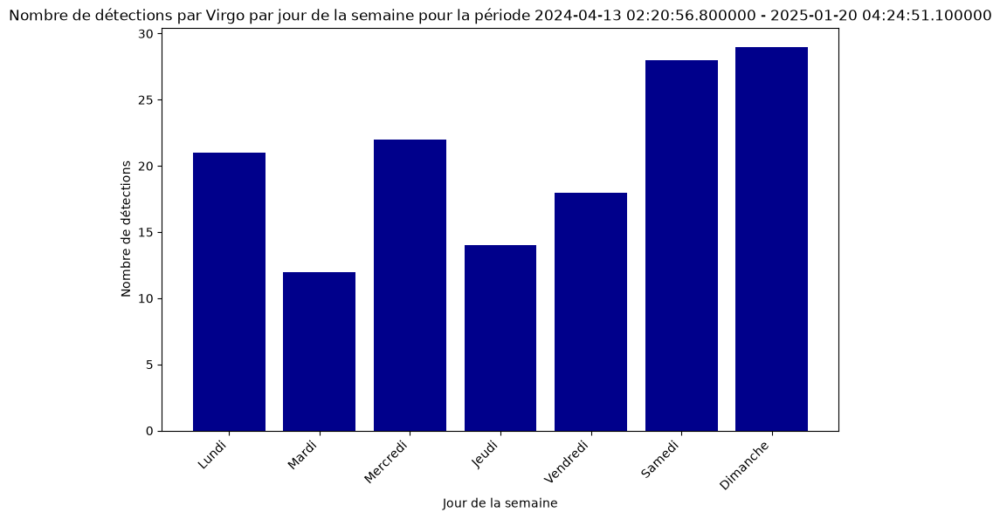

In [15]:
#O4b

fct.day_night_ratio(O4b_data)
fct.plot_events(O4b_data,"O4a",offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim = (start_O4b,end_O4b+ pd.Timedelta(days=1)),outfile = "O4b")
fct.plot_days(O4b_data)
#fct.plot_rate(O4b_data)

# ANALYSE SUR 2 MOIS

In [16]:
data = pd.read_pickle("data_V1.pkl")
data_19 = fct.select_year(data,2019)
data_20 = fct.select_year(data,2020)
data_21 = fct.select_year(data,2021)
data_22 = fct.select_year(data,2022)
data_23 = fct.select_year(data,2023)
data_24 = fct.select_year(data,2024)
data_25 = fct.select_year(data,2025)

In [17]:
psd_p_19 , dates_p_19, freqs_p_19 = fct.load_psd("PSD_PII_2019-1-1_2019-12-31_RR.npz")
psd_p_19 , dates_p_19, freqs_p_19 = fct.load_psd("PSD_PII_2019-1-1_2019-12-31_RR.npz")
psd_p_20 , dates_p_20, freqs_p_20 = fct.load_psd("PSD_PII_2020-1-1_2020-2-29_RR.npz")
psd_p_24 , dates_p_24, freqs_p_24 = fct.load_psd("PSD_PII_2024-1-1_2024-12-31_RR.npz")

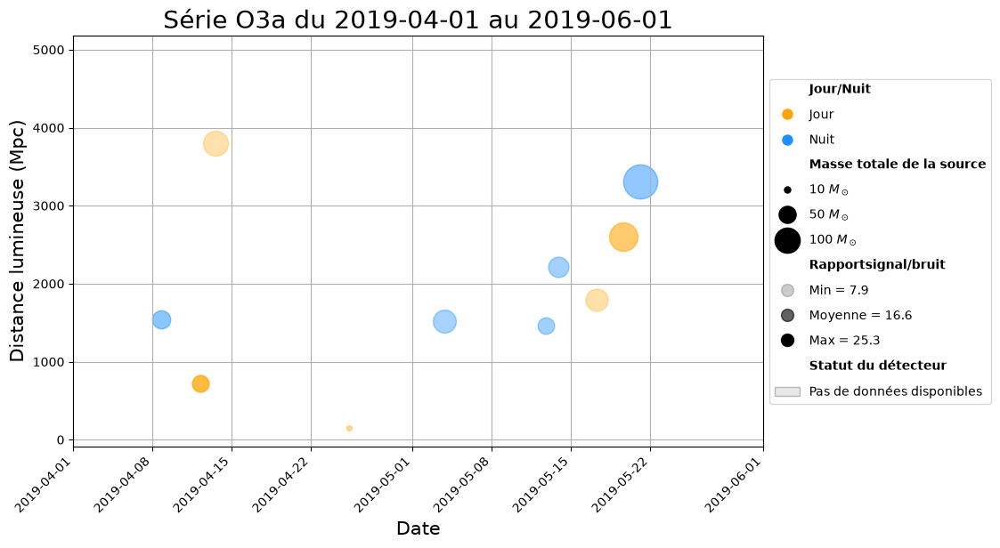

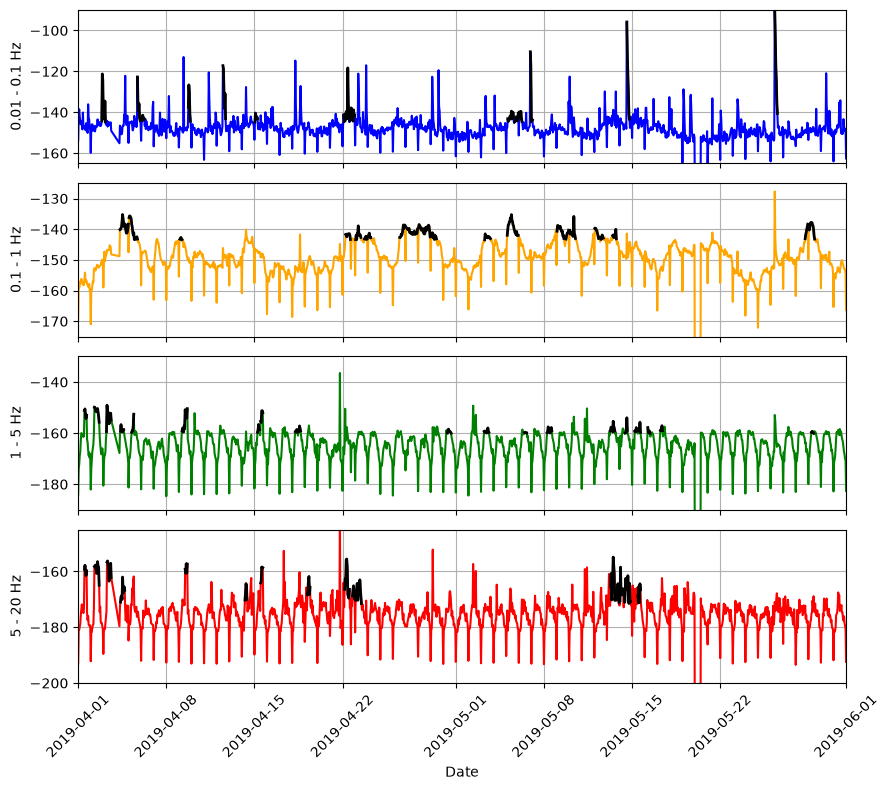

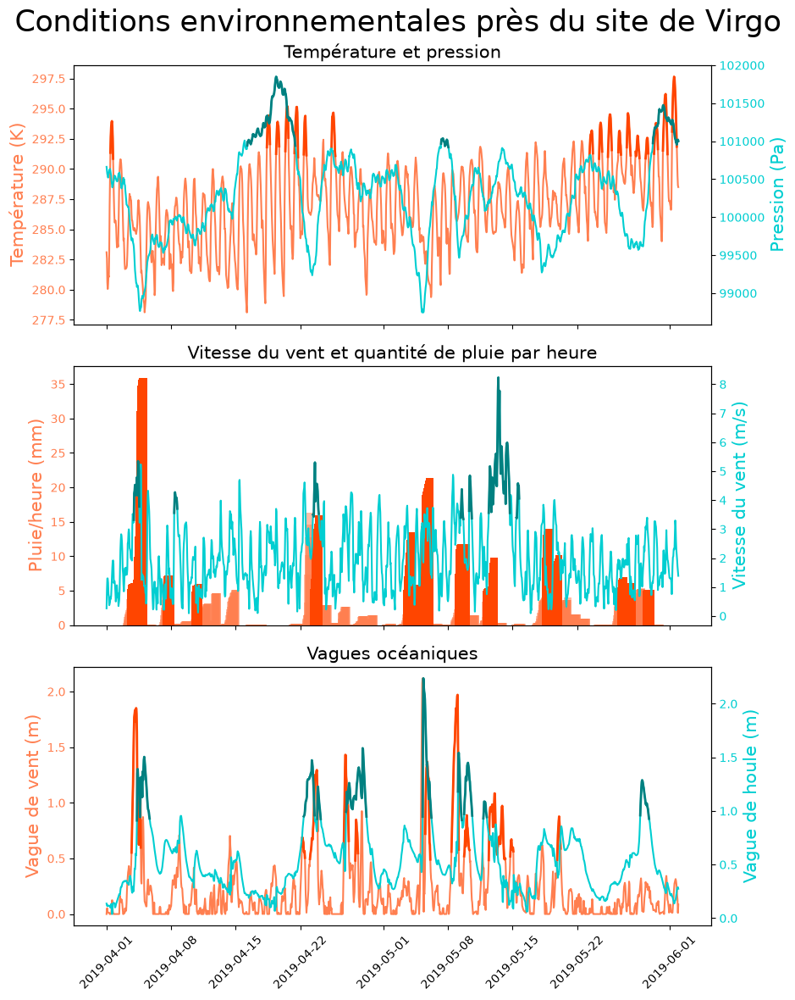

In [18]:
limx=(datetime(2019,4,1),datetime(2019,6,1))
fct.plot_events(data_19,"O3a",offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx,  we=False, eq = False)
limx = ("2019-04-01","2019-06-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

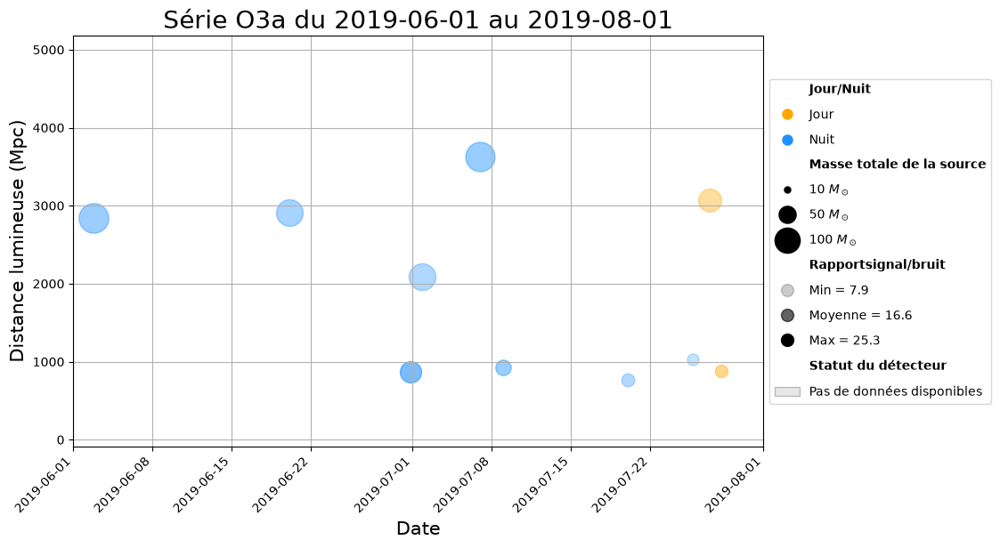

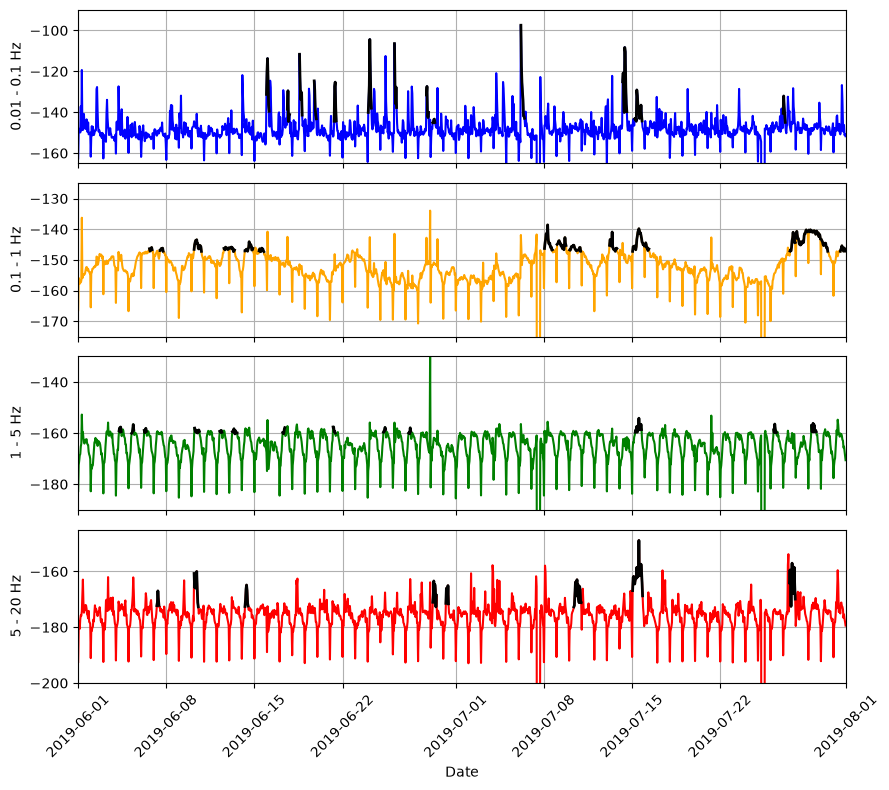

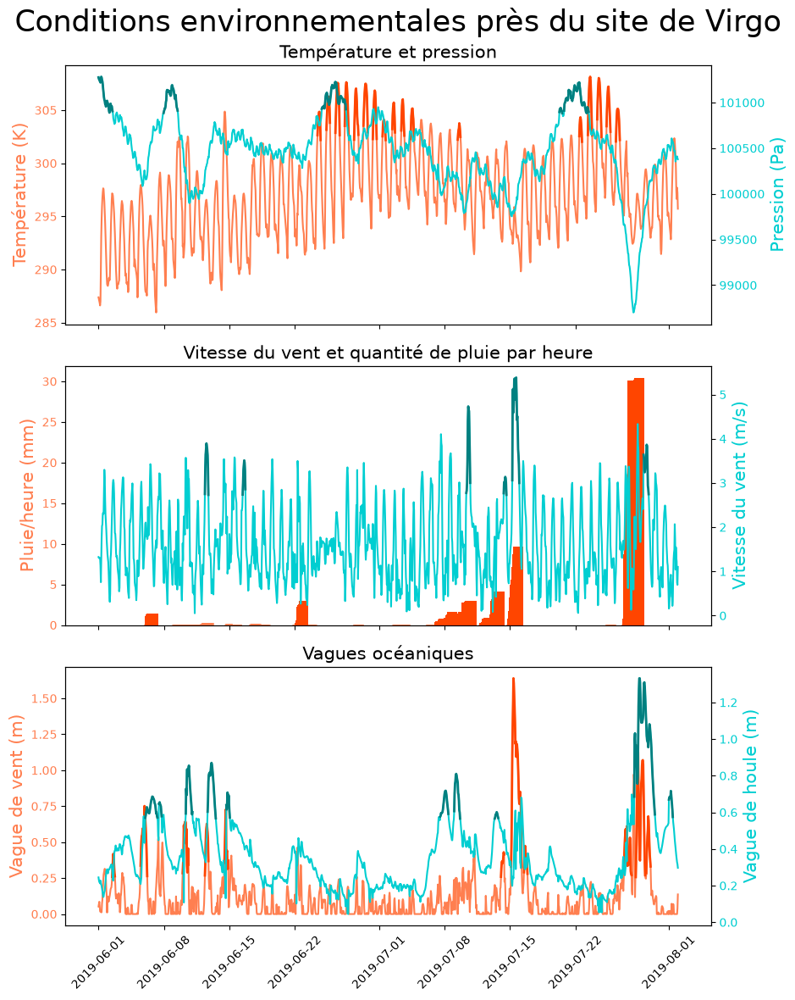

In [19]:
limx=(datetime(2019,6,1),datetime(2019,8,1))
fct.plot_events(data_19,"O3a", offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx,  we=False, eq = False)
limx = ("2019-06-01","2019-08-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

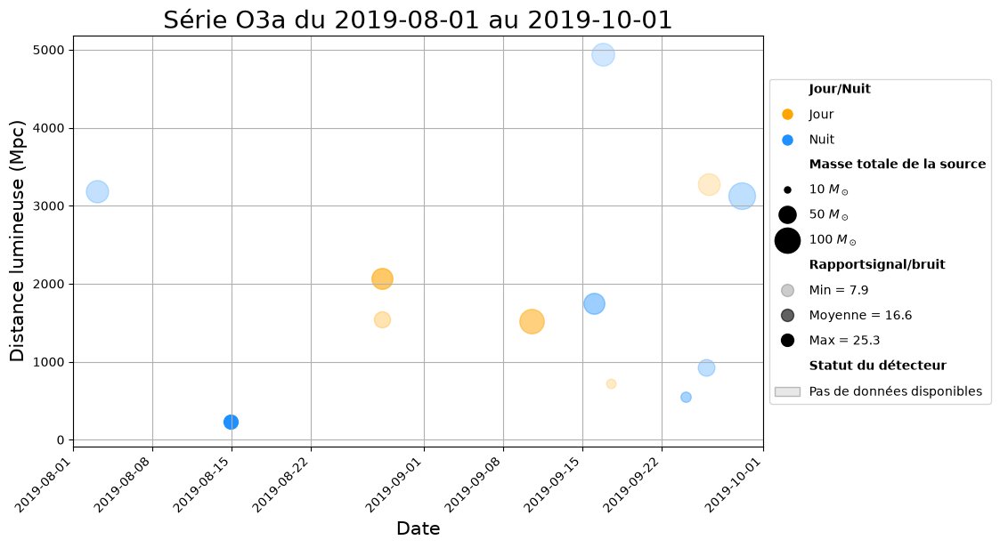

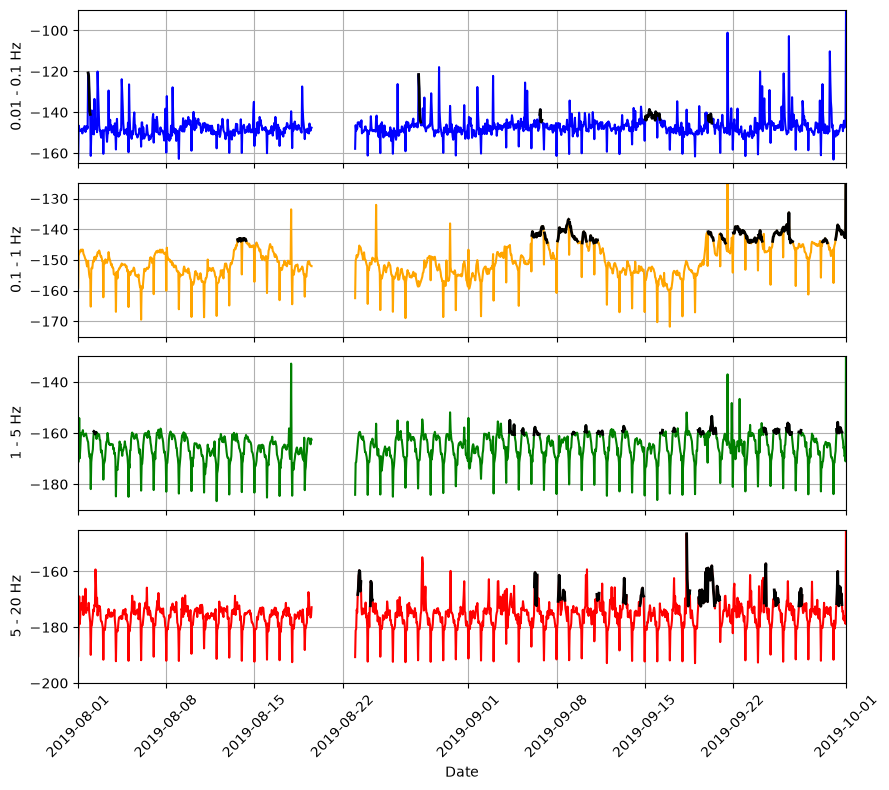

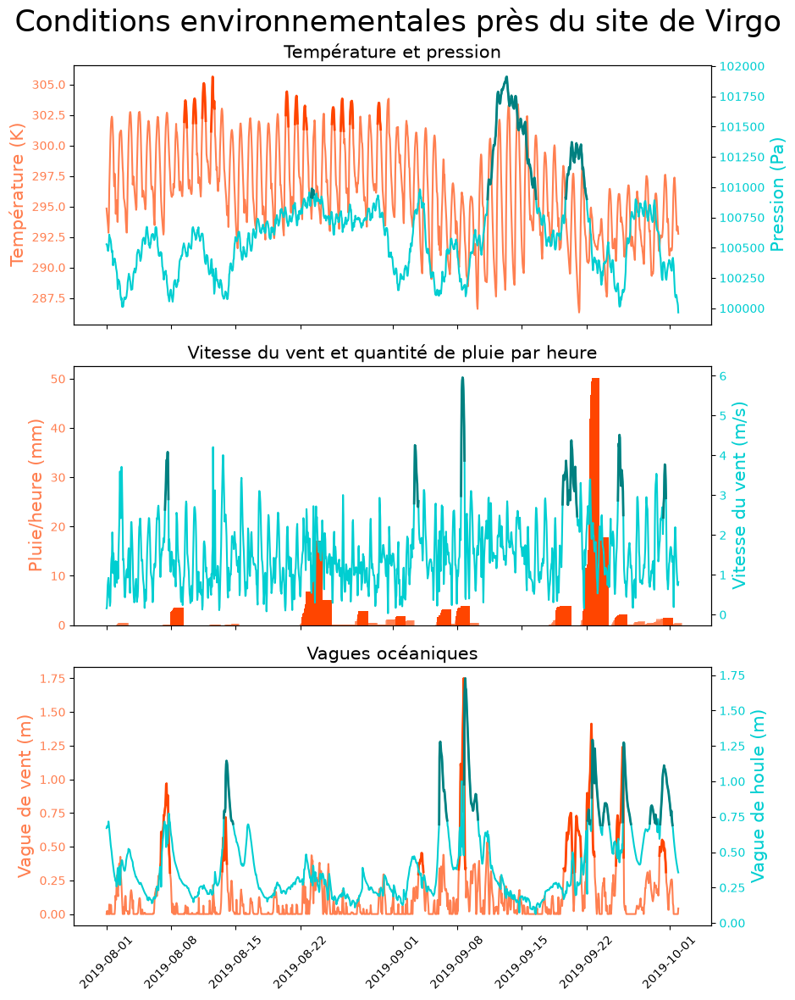

In [20]:
limx=(datetime(2019,8,1),datetime(2019,10,1))
fct.plot_events(data_19,"O3a", offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx, we=False, eq = False)
limx = ("2019-08-01","2019-10-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

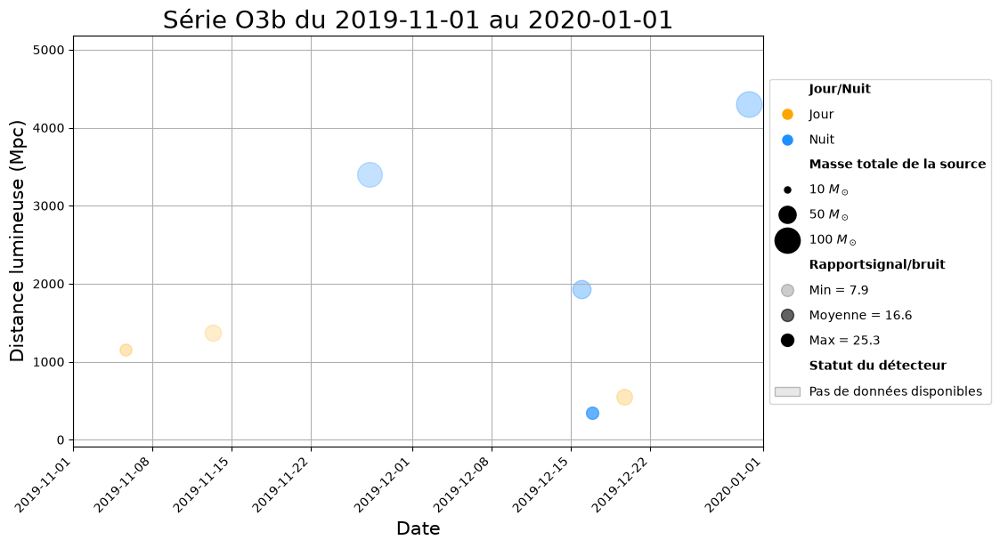

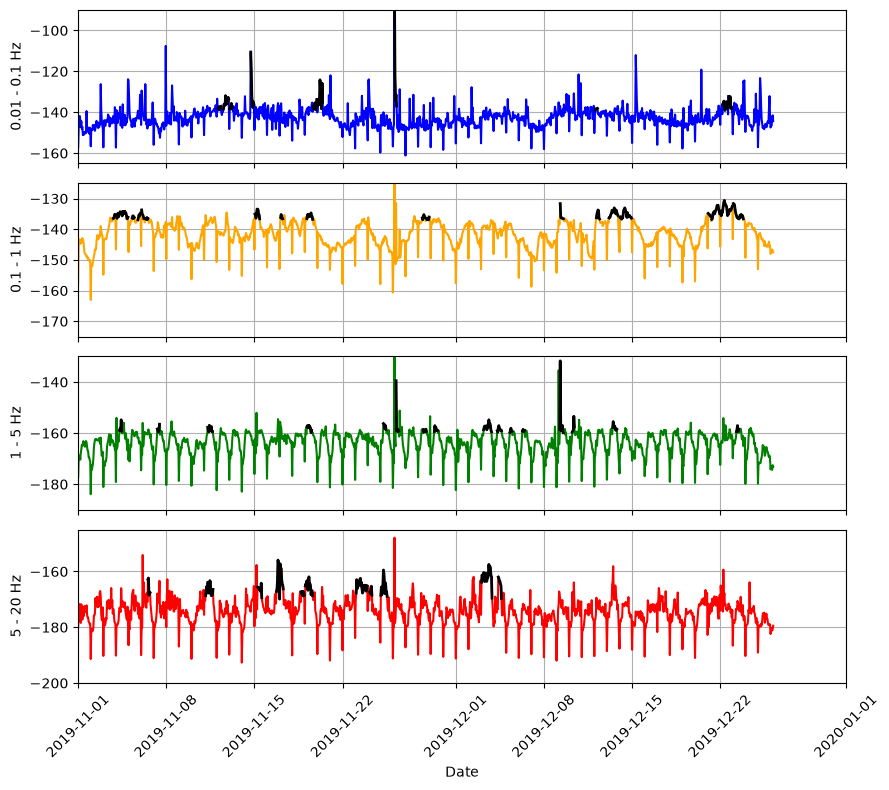

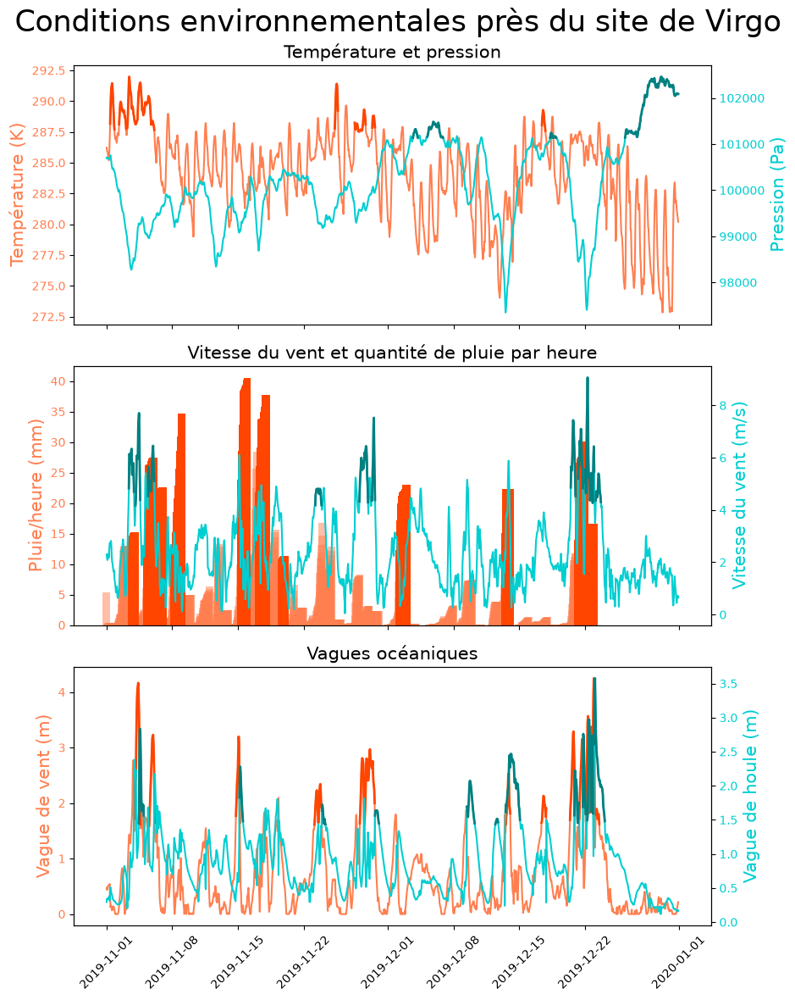

In [21]:
limx=(datetime(2019,11,1),datetime(2020,1,1))
fct.plot_events(data_19,"O3b", offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx, we=False, eq = False)
limx = ("2019-11-01","2020-01-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

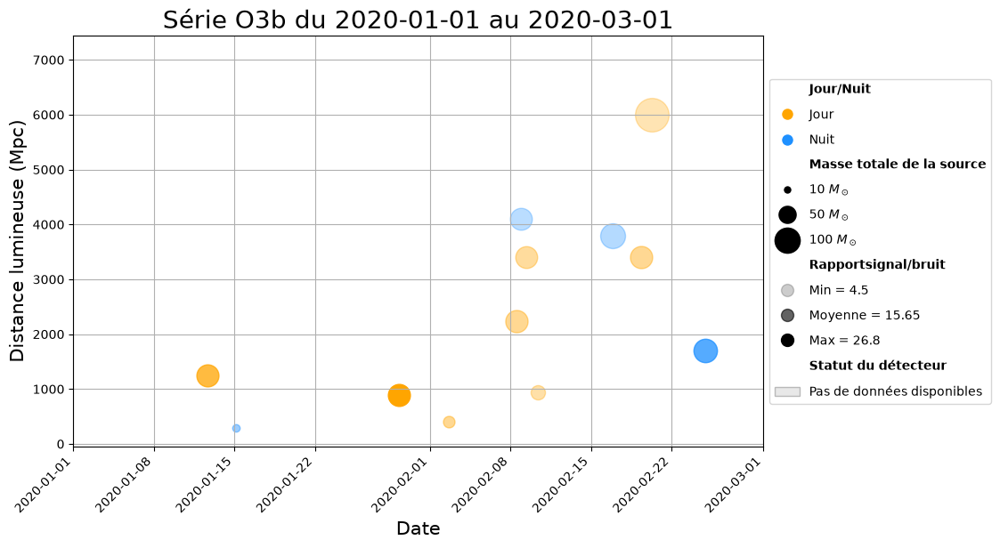

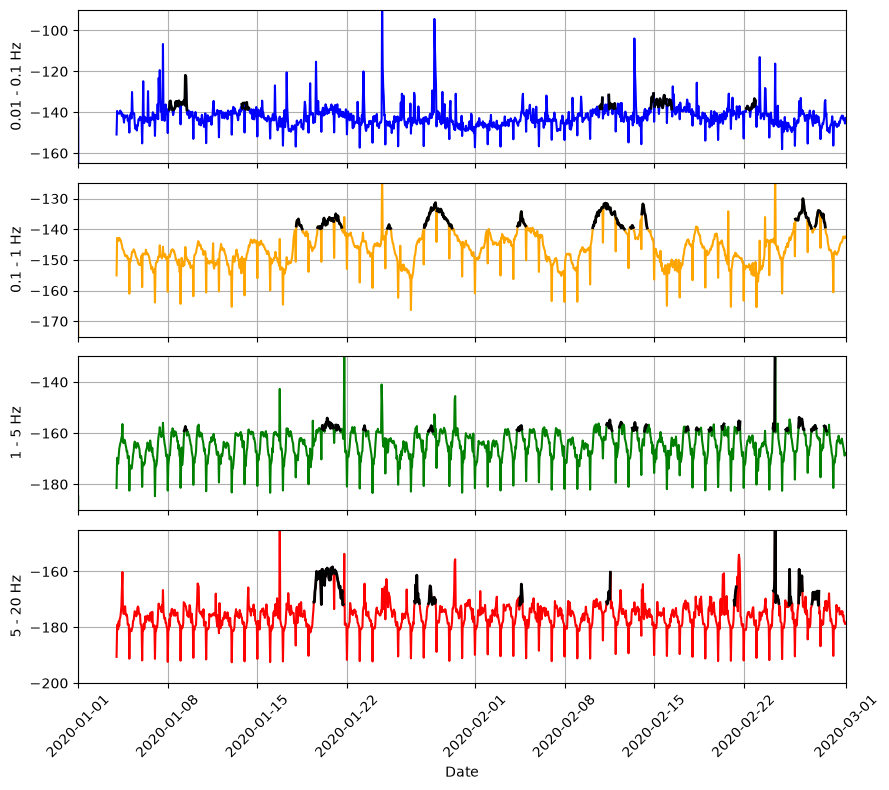

In [22]:
limx=(datetime(2020,1,1),datetime(2020,3,1))
fct.plot_events(data_20,"O3b", offline_periods=[(datetime(2020,3,28),datetime(2020,12,31))], lim =limx )
fct.median_4_bis(psd_p_20, dates_p_20, freqs_p_20,limx=limx,  we=False, eq = False)

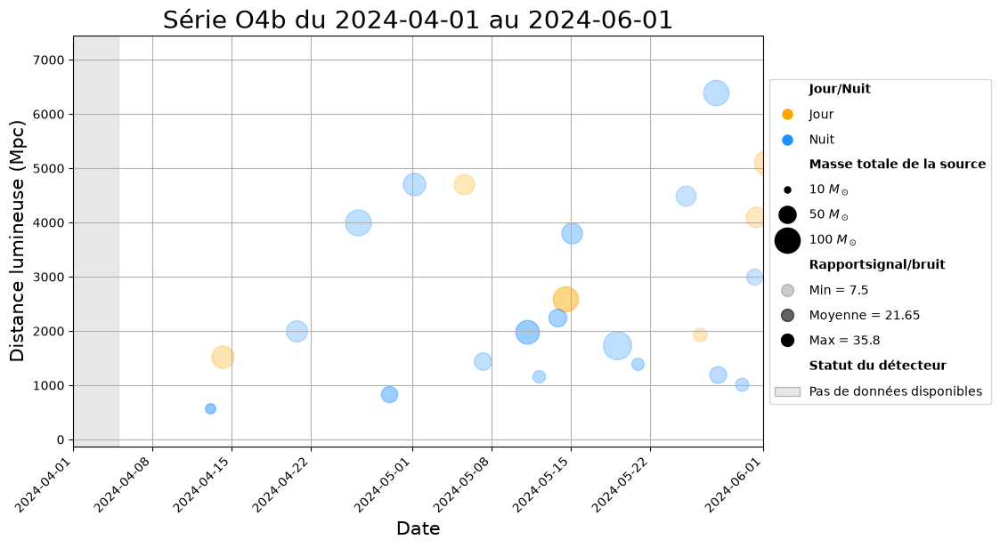

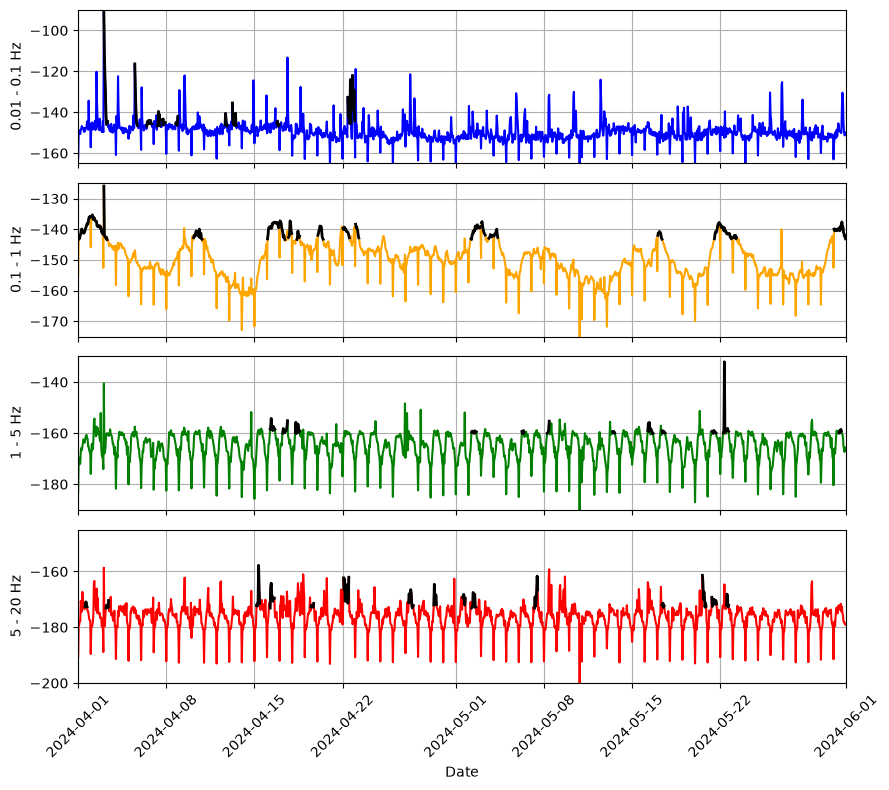

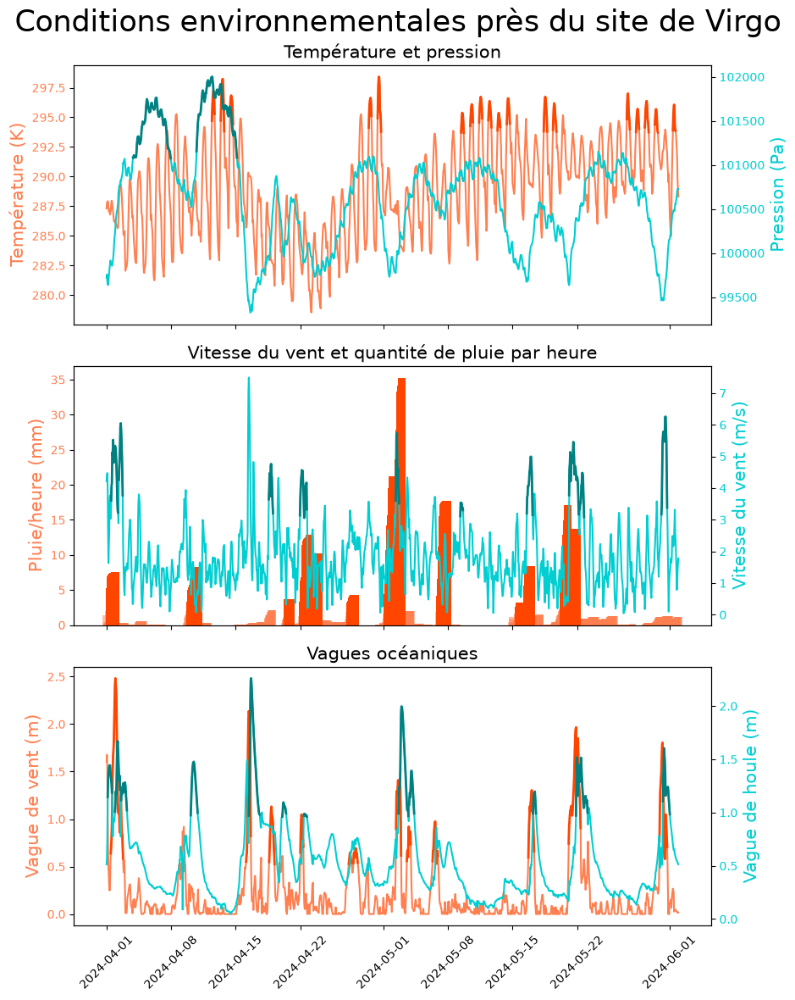

In [23]:
limx=(datetime(2024,4,1),datetime(2024,6,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx,outfile="avril_mai_24_e.png")
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx,  we=False, eq = False,outfile="avril_mai_24_s.png")
limx = ("2024-04-01","2024-06-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

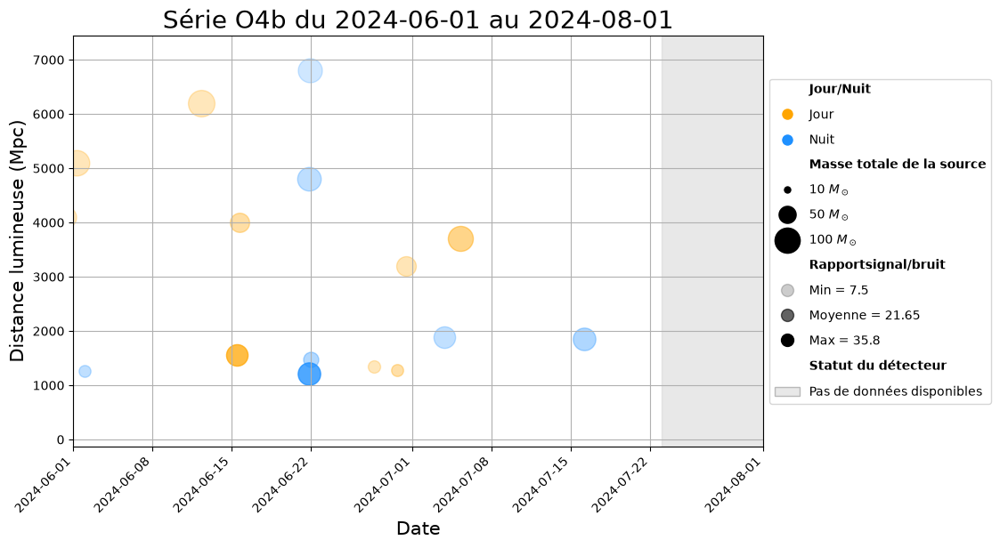

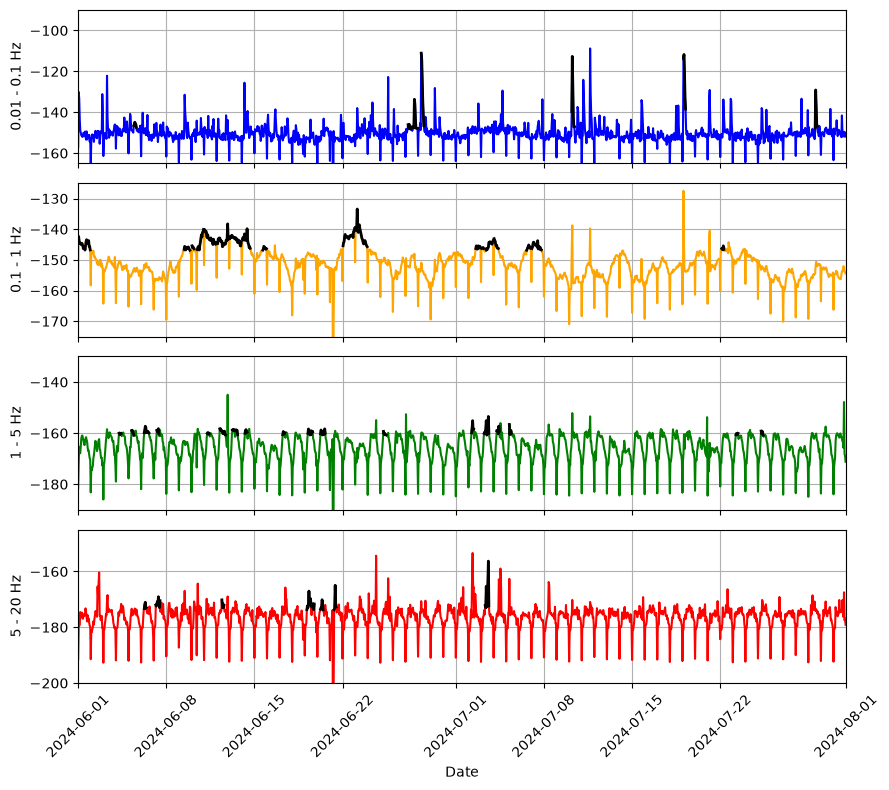

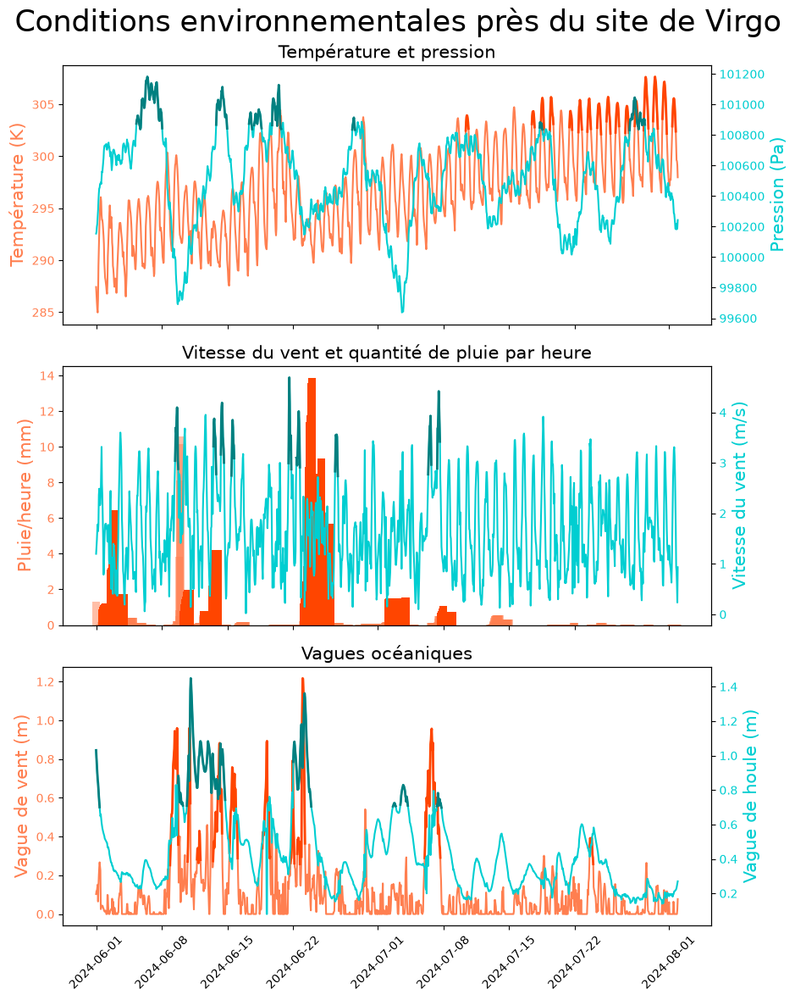

In [24]:
limx=(datetime(2024,6,1),datetime(2024,8,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx )
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx,  we=False, eq = False)
limx = ("2024-06-01","2024-08-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

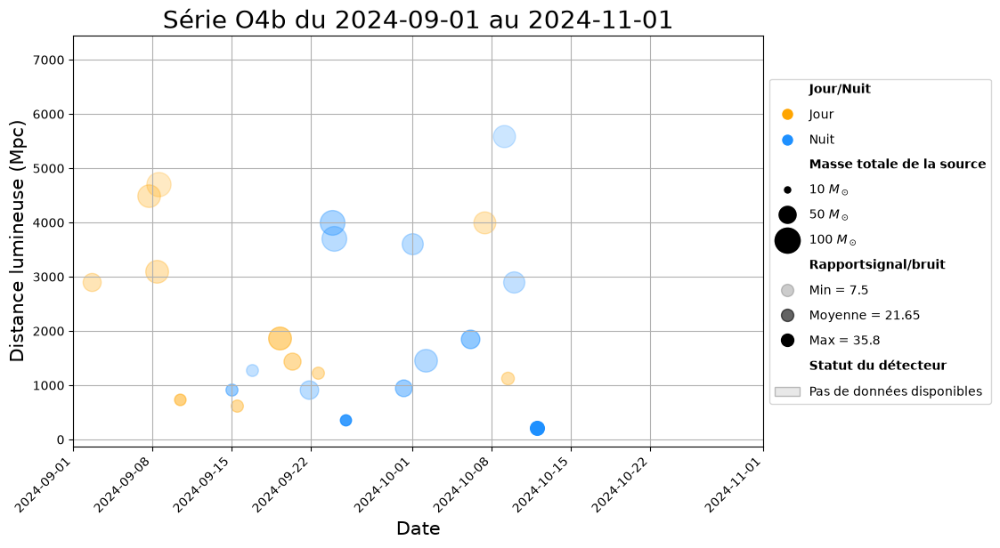

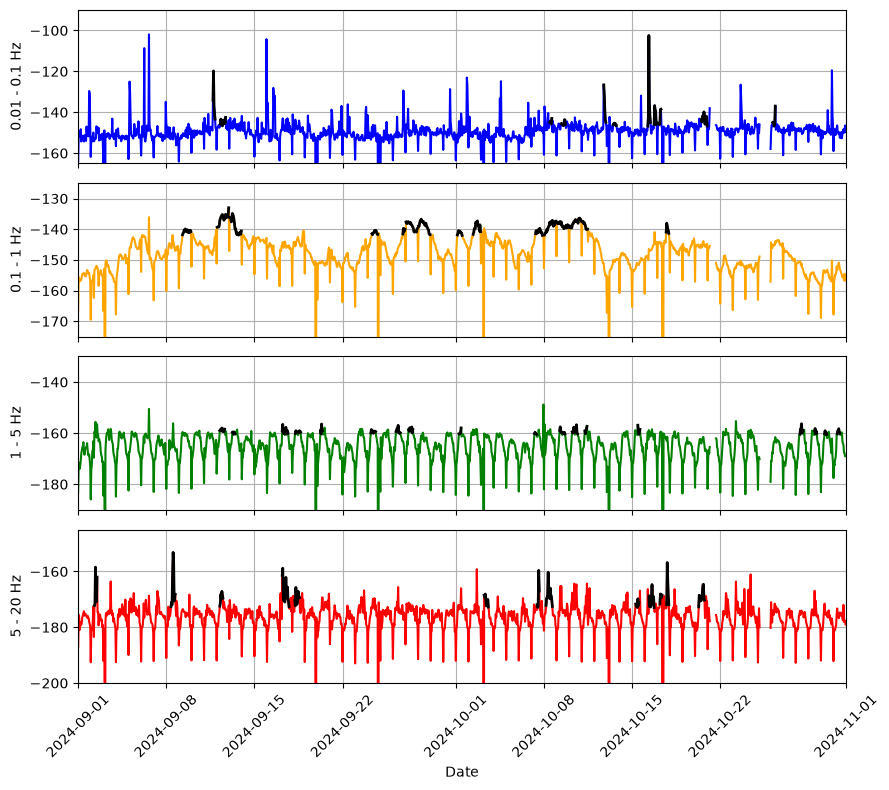

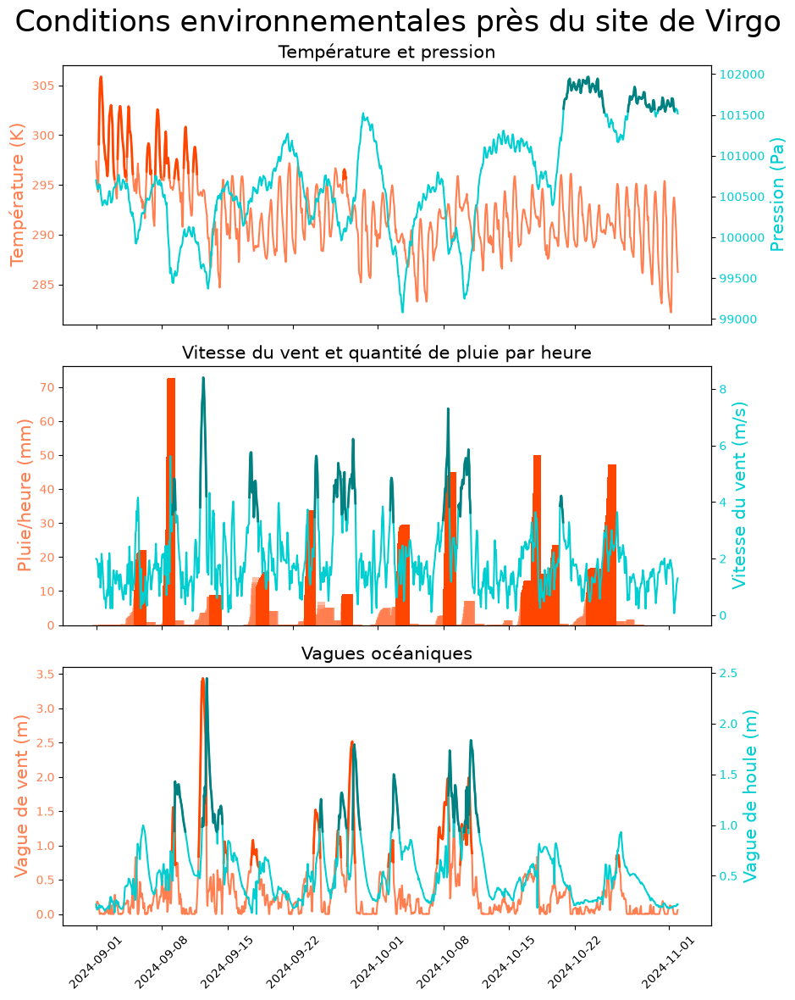

In [25]:
limx=(datetime(2024,9,1),datetime(2024,11,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx )
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx,  we=False, eq = False)
limx = ("2024-09-01","2024-11-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

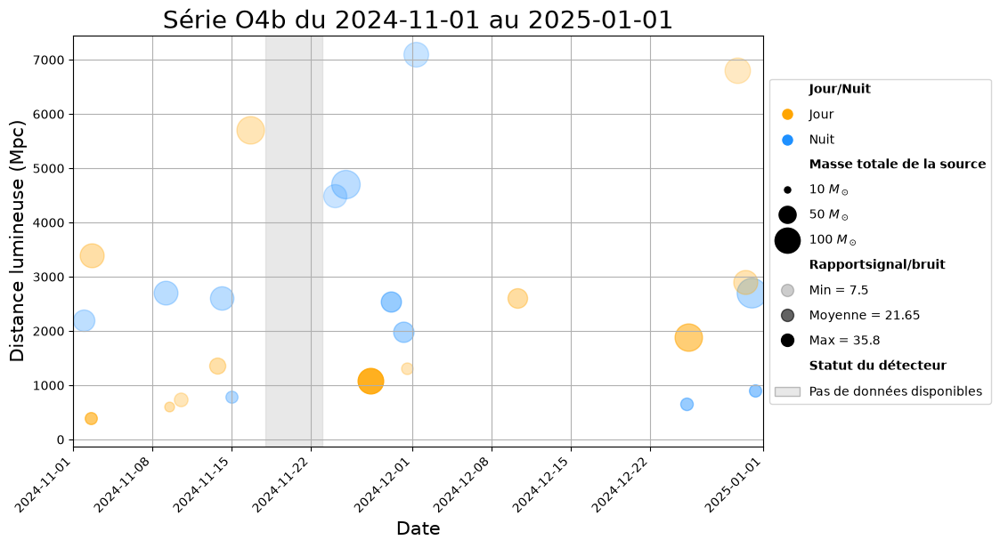

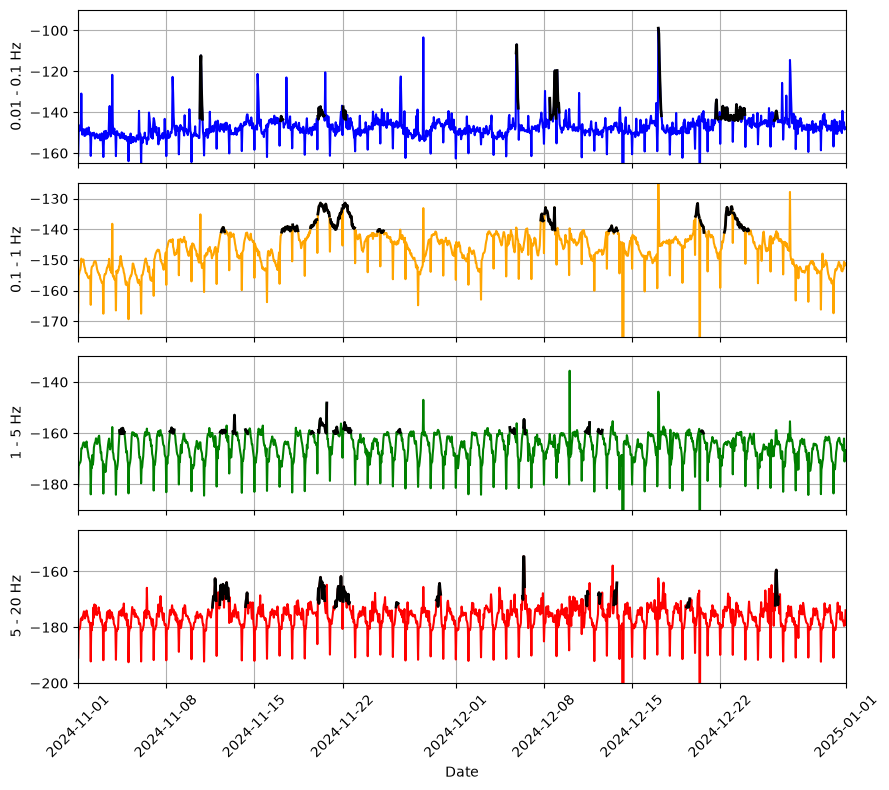

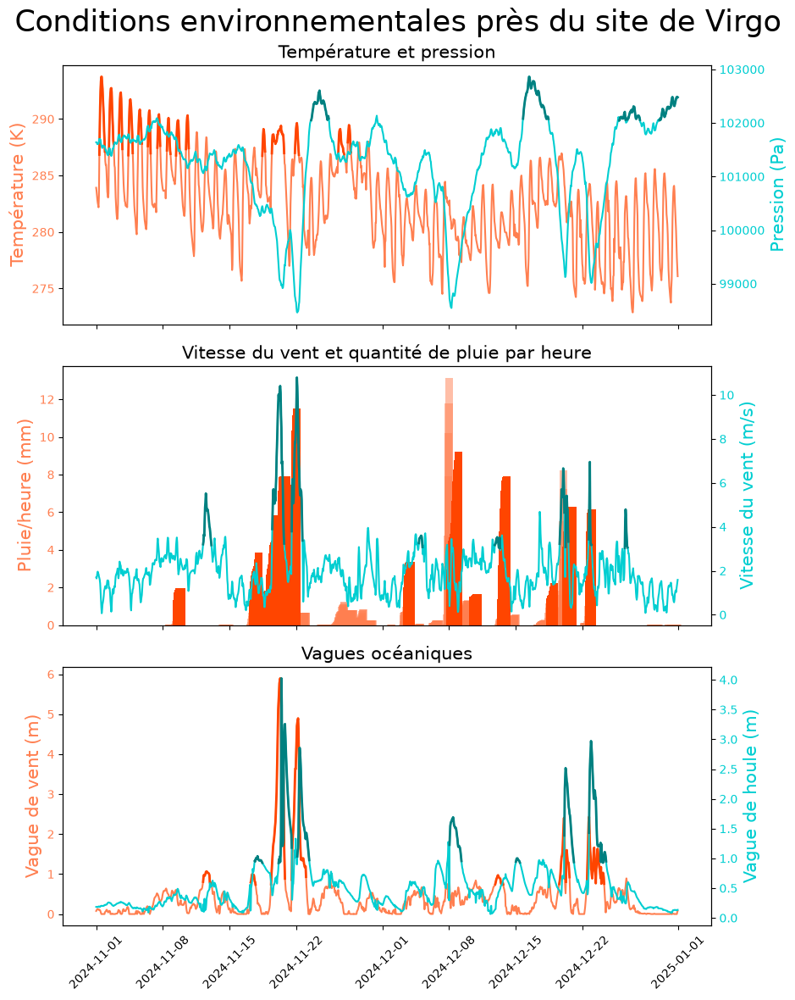

In [26]:
limx=(datetime(2024,11,1),datetime(2025,1,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx )
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx, we=False, eq = False)
limx = ("2024-11-01","2025-01-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

# ANALYSE SUR 1 MOIS (bandes de fréquences)

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

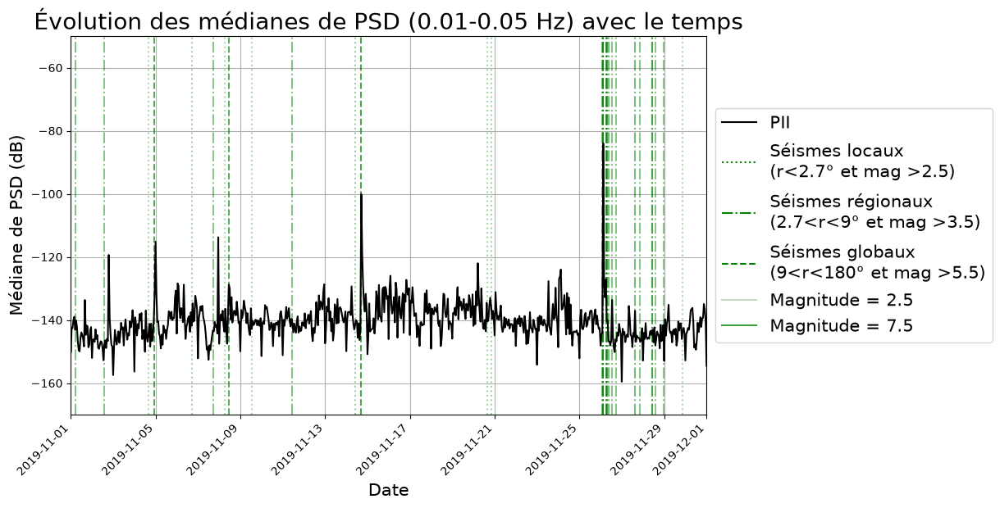

In [4]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=0.01, f2=0.05, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)),limy=(-170,-50), plot=True, we = False, eq=True,outfile="seisme")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

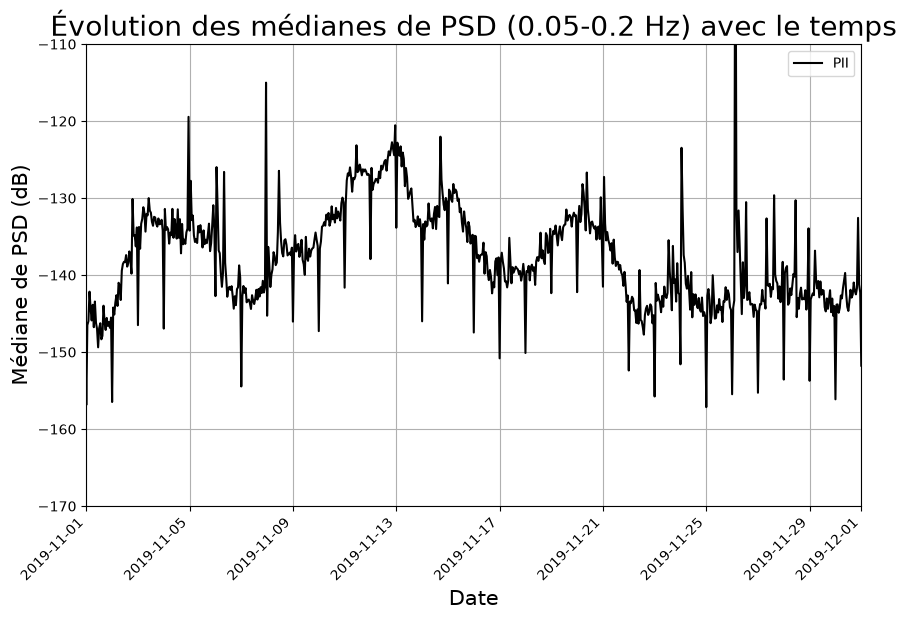

In [12]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=0.05, f2=0.2, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)), limy=(-170,-110), plot=True, we = False, eq=False,outfile="vague")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

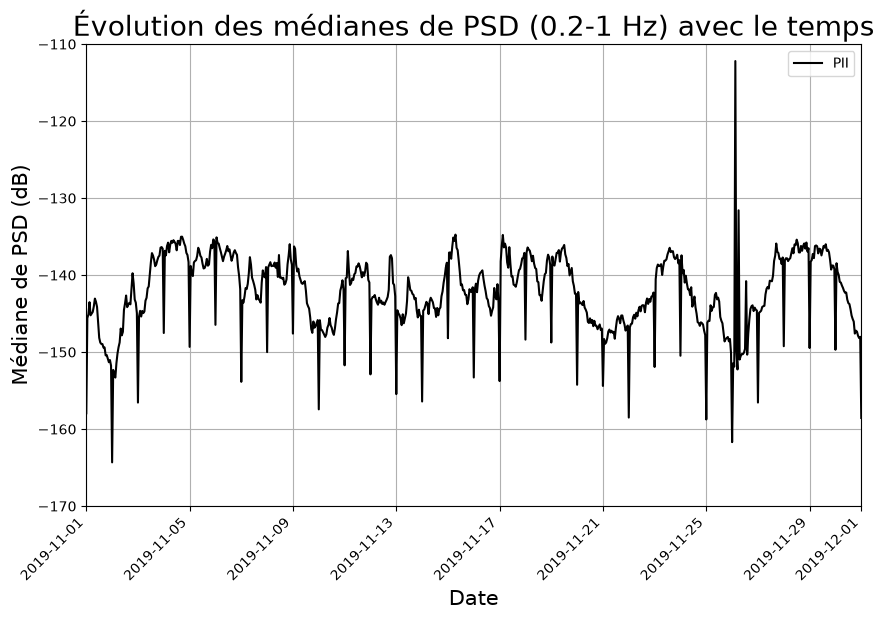

In [13]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=0.2, f2=1, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)), limy=(-170,-110), plot=True, we = False, eq=False,outfile="envt")

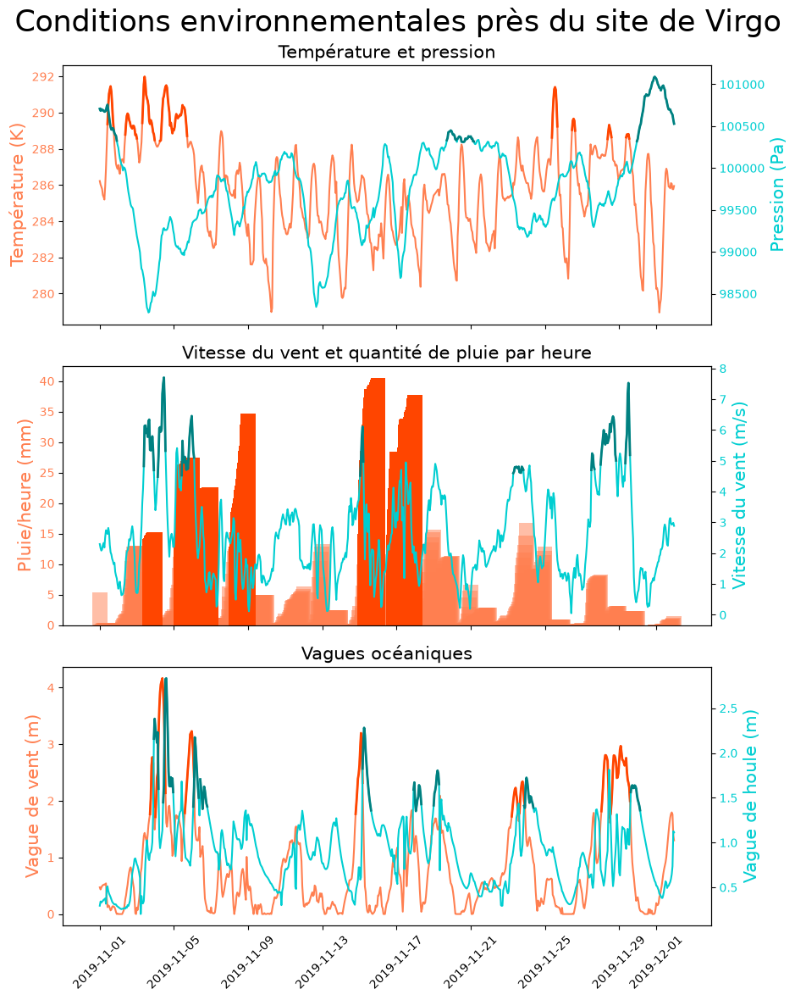

In [8]:
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx=("2019-11-01","2019-12-01"), p=85, n=5,outfile="meteo")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

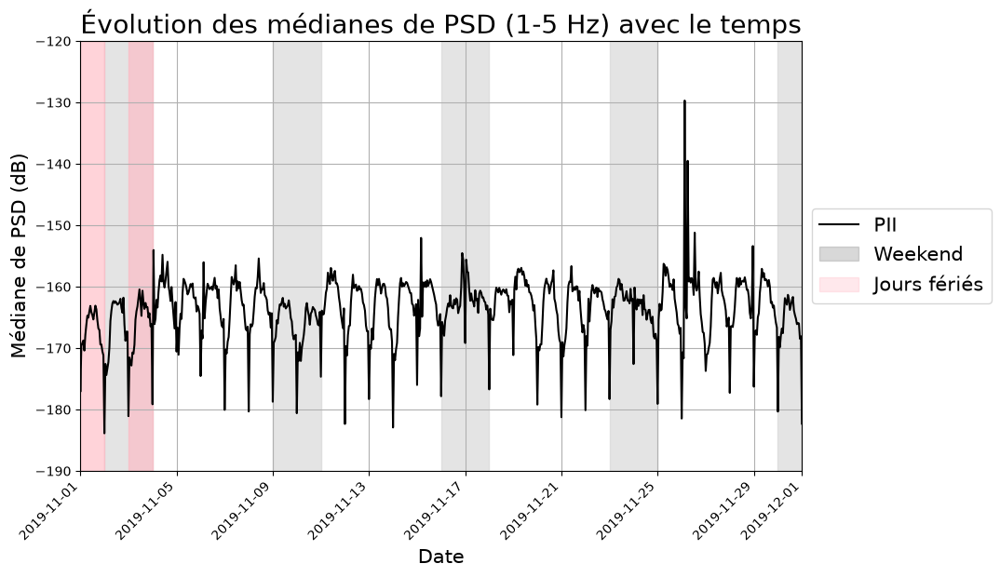

In [14]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=1, f2=5, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)),limy=(-190,-120), plot=True, we = True, eq=False,outfile="anthropique")

# STAT PSD

## Corrélation psd 


In [3]:
all_dates, median_psd_02_1=fct.median_plot(psd_p_19, dates_p_19, freqs_p_19, f1=0.2, f2=1, labell = "PII", plot=False, we = False, eq=False)
all_dates, median_psd_001_02=fct.median_plot(psd_p_19, dates_p_19, freqs_p_19, f1=0.2, f2=1, labell = "PII", plot=False, we = False, eq=False)
all_dates, median_psd_1_5=fct.median_plot(psd_p_19, dates_p_19, freqs_p_19, f1=1, f2=5, labell = "PII", plot=False, we = False, eq=False)

data_rain = xr.open_dataset('virgo_rain_2019.nc', engine='netcdf4')
rain = data_rain['tp']
rain_y,dates = fct.select_data(rain,"2019-01-01","2019-12-31")

data= xr.open_dataset("virgo_ocean_2019_data.nc", engine='netcdf4')

wind = data["shww"]
wind_y,dates = fct.select_data(wind,"2019-01-01","2019-12-31", lat = 43.5, lon = 10.3)

swell = data['shts']
swell_y,dates = fct.select_data(swell,"2019-01-01","2019-12-31", lat = 43.5, lon = 10.3)

df_psd_021 = pd.DataFrame(
    {"PSD021": median_psd_02_1},
    index=pd.to_datetime(all_dates)
)
df_psd_00102 = pd.DataFrame(
    {"PSD00102": median_psd_001_02},
    index=pd.to_datetime(all_dates)
)

df_wind = pd.DataFrame(
    {"Wind": wind_y},
    index=pd.to_datetime(dates)
)

df_swell = pd.DataFrame(
    {"Swell": swell_y},
    index=pd.to_datetime(dates)
)

df_rain = pd.DataFrame(
    {"Rain": rain_y},
    index=pd.to_datetime(dates)
)

df_day = pd.DataFrame(
    {"day": all_dates.weekday + 1},
    index=all_dates
)

df_hour = pd.DataFrame(
    {"Hour": all_dates.hour},
    index=all_dates
)

df_psd_15 = pd.DataFrame(
    {"PSD15": median_psd_1_5},
    index=pd.to_datetime(all_dates)
)

df = df_psd_021.join(df_psd_00102, how = "inner")
df = df.join(df_wind, how="inner")

df = df.join(df_swell, how="inner")

df = df.join(df_rain, how="inner")

df = df.join(df_hour, how="inner")
df = df.join(df_day, how="inner")

df = df.join(df_psd_15, how="inner")

NameError: name 'psd_p_19' is not defined

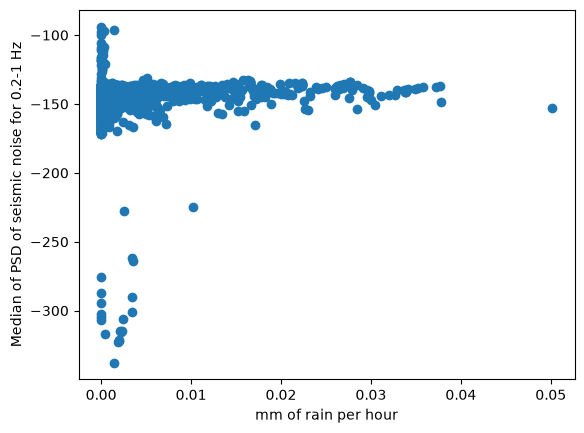

In [17]:
plt.scatter(df["Rain"],df["PSD021"])
plt.xlabel("mm of rain per hour")
plt.ylabel('Median of PSD of seismic noise for 0.2-1 Hz')
plt.show()

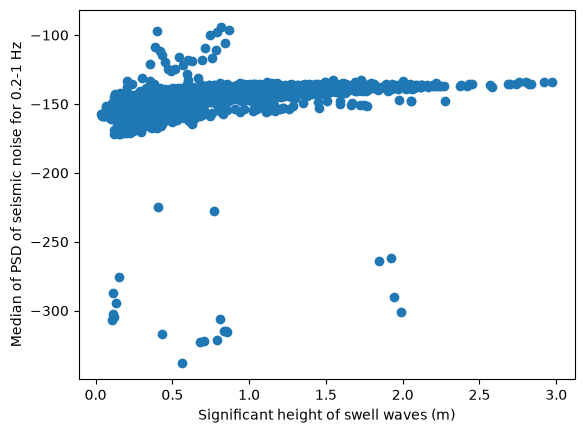

In [18]:
plt.scatter(df["Swell"],df["PSD021"])
plt.xlabel("Significant height of swell waves (m)")
plt.ylabel('Median of PSD of seismic noise for 0.2-1 Hz')
plt.show()

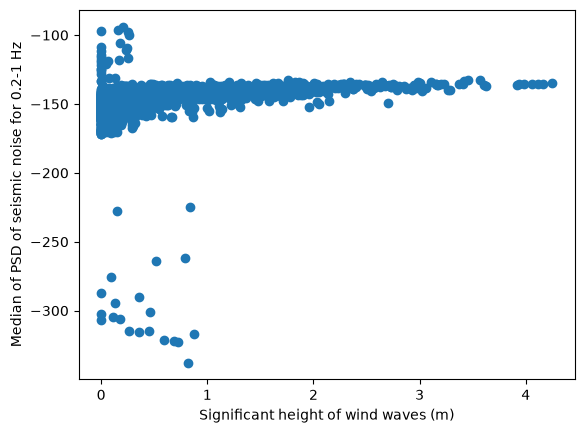

In [19]:
plt.scatter(df["Wind"],df["PSD021"])
plt.xlabel("Significant height of wind waves (m)")
plt.ylabel('Median of PSD of seismic noise for 0.2-1 Hz')
plt.show()

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

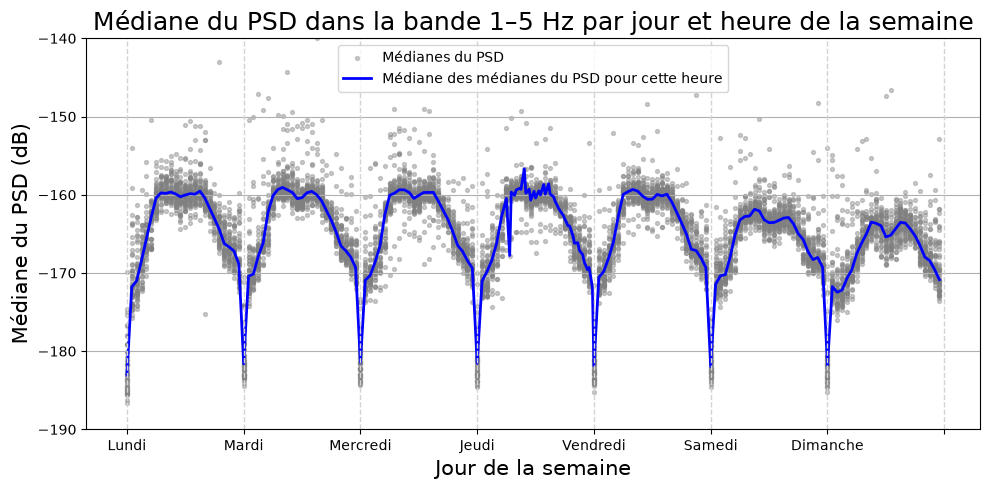

In [20]:
import functions as fct
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# Chargement des données
# ==========================================================

psd_p_19, dates_p_19, freqs_p_19 = fct.load_psd(
    "PSD_PII_2019-1-1_2019-12-31_RR.npz"
)

# ==========================================================
# Médianes PSD
# ==========================================================

all_dates, median_psd_021 = fct.median_plot(
    psd_p_19,
    dates_p_19,
    freqs_p_19,
    f1=0.2,
    f2=1,
    labell="PII",
    plot=False,
)

all_dates, median_psd_15 = fct.median_plot(
    psd_p_19,
    dates_p_19,
    freqs_p_19,
    f1=1,
    f2=5,
    labell="PII",
    plot=False,
)

# ==========================================================
# DataFrame
# ==========================================================

df = pd.DataFrame(
    {
        "PSD021": median_psd_021,
        "PSD15": median_psd_15,
    },
    index=pd.to_datetime(all_dates)
)

# Heure de la semaine (0 -> 168 h)
df["week_hour"] = (
    df.index.weekday * 24
    + df.index.hour
    + df.index.minute / 60
)

# ==========================================================
# Calcul de la médiane
# ==========================================================

hour_points = df[["week_hour", "PSD15"]]

hour_median = (
    df.groupby("week_hour")["PSD15"]
    .median()
)

# ==========================================================
# Figure
# ==========================================================

plt.figure(figsize=(10,5))

plt.scatter(
    hour_points["week_hour"],
    hour_points["PSD15"],
    color="grey",
    s=8,
    alpha=0.4, label = "Médianes du PSD"
)

plt.plot(
    hour_median.index,
    hour_median.values,
    color="blue",
    linewidth=2,
    label="Médiane des médianes du PSD pour cette heure"
)

# Lignes verticales séparant les jours
for h in range(0, 169, 24):
    plt.axvline(
        h,
        color="lightgrey",
        linestyle="--",
        linewidth=1
    )

plt.xticks(
    np.arange(0, 169, 24),
    ["Lundi", "Mardi", "Mercredi", "Jeudi", "Vendredi", "Samedi", "Dimanche", ""]
)

plt.xlabel("Jour de la semaine",size=15)
plt.ylabel("Médiane du PSD (dB)",size=15)
plt.title("Médiane du PSD dans la bande 1–5 Hz par jour et heure de la semaine",size=18)
plt.grid(axis="y")
plt.ylim(-190, -140)

plt.legend()

plt.tight_layout()
plt.savefig("medianemediane.png", dpi=300, bbox_inches="tight")

plt.show()

## Poisson

In [12]:
df_poisson = O4b_data.copy() 
df_poisson  = df_poisson.set_index("date")
events_per_day = df_poisson.resample("D").size()

In [13]:
moyenne = events_per_day.mean()
variance = events_per_day.var(ddof=1)   # ou np.var(events_per_week, ddof=1)

print(moyenne)
print(variance)
print("Variance / moyenne =", variance / moyenne)

0.508833922261484
0.6763401248026465
Variance / moyenne = 1.3291962174940901


# BNS range

In [ ]:
df_O2=fct.process_data("O2")
df_O3a=fct.process_data("O3a")
df_O3b=fct.process_data("O3b")
df_O4b=fct.process_data("O4b")

In [ ]:
fct.plot_sensitivity(df_O3b,ylim=(30,70),xlim=(datetime(2019,11,1),datetime(2019,12,1)),we=True, eq = True)

In [ ]:
fct.plot_sensitivity(df_O3b,ylim=(30,70),xlim=(datetime(2019,11,20),datetime(2019,12,1)),we=True, eq = True)

In [ ]:
fct.plot_sensitivity(df_O3b,type="duty_cycle",xlim=(datetime(2019,11,1),datetime(2019,12,1)),ylim=(0,110),we=True, eq = True)

In [ ]:
fct.plot_sensitivity(df_O3b,type="duty_cycle",xlim=(datetime(2019,11,20),datetime(2019,12,1)),ylim=(0,110),we=True, eq = True)

In [ ]:
df_O3 = pd.concat([df_O3a, df_O3b])

df_O3 = df_O3.sort_index()
df_O3["BNS_daily_mean"] = (
    df_O3["BNS"]
    .rolling("7D", center=True)
    .mean()
)

df_O3["BNS_d_fluctuation"] = (
    df_O3["BNS"] - df_O3["BNS_daily_mean"]
)


In [ ]:
df_O3["hour"] = df_O3.index.floor("h")

df_merged = df.merge(
    df_O3,
    on="hour",
    how="inner"
)
df_merged

df_clean = df_merged.drop(df_merged.nsmallest(10, "BNS").index)

In [ ]:
df_clean

In [ ]:
fct.plot_bns_param(df_clean, 'BNS','PSD 0.01-0.2Hz',xlim=(-180,-100),dt=1, window = 2)
fct.plot_bns_param(df_clean,'BNS', 'PSD 0.2-1Hz',xlim=(-180,-100),dt=1, window = 2)
fct.plot_bns_param(df_clean, 'BNS','PSD 1-5Hz',xlim=(-190,-100),dt=1,window = 2)

In [ ]:
fct.plot_bns_param(df_clean, 'BNS','Wind waves', dt = 0.1, window = 0.1)
fct.plot_bns_param(df_clean, 'BNS','Swell waves',dt=0.1,window=0.1)
fct.plot_bns_param(df_clean, 'BNS','Rain',dt=0.005,window=0.01)

In [ ]:
df_O3["hour"] = (
    df_O3.index.hour 
    + df_O3.index.minute/60
)

hours, median_profile = fct.get_median_profile(df_O3,param_1="BNS_d_fluctuation",param_2="hour",dt=0.5,window=0.5)

plt.scatter(
    df_O3["hour"],
    df_O3["BNS_d_fluctuation"],
    s=3,
    alpha=0.3, color = "grey"
)

plt.plot(
    hours,
    median_profile,
    color="red",
    linewidth=2,    label="Médiane glissante, dt = 0.5, window = 0.5"

)
plt.ylim(-2,2)
plt.xticks(np.arange(0,25,2))
plt.xlabel("Heure UTC")
plt.ylabel("Variation BNS range (Mpc)")
plt.grid()
plt.legend()
plt.savefig("BNS_1d", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
df_O3["week_hour"] = (
    df_O3.index.dayofweek * 24
    + df_O3.index.hour
    + df_O3.index.minute / 60
)
week_hours, median_profile = fct.get_median_profile(df_O3,param_1="BNS_d_fluctuation",param_2="week_hour",dt=1,window=1)

plt.figure(figsize=(12,4))

plt.scatter(
    df_O3["week_hour"],
    df_O3["BNS_d_fluctuation"],
    s=3,color="grey",
    alpha=0.2
)

plt.plot(
    week_hours,
    median_profile,
    color="red",
    linewidth=2,
    label="Médiane glissante, dt = 1, window = 1"
)


for h in range(0,169,24):
    plt.axvline(
        h,
        color="lightgrey",
        linestyle="--"
    )


plt.xticks(
    np.arange(0,169,24),
    [
        "Lundi",
        "Mardi",
        "Mercredi",
        "Jeudi",
        "Vendredi",
        "Samedi",
        "Dimanche",
        ""
    ]
)

plt.xlabel("Jour de la semaine")
plt.ylabel("Variation BNS range (Mpc)")
plt.grid()
plt.legend()
plt.ylim(-3,2)
plt.savefig("bns_w", dpi=300, bbox_inches="tight")
plt.show()

# STRAIN

## 4 au 6 juillet 2024

In [7]:
psd,dates,freqs=fct.load_psd_strain("psd_strain_1404143286_2j.npz")

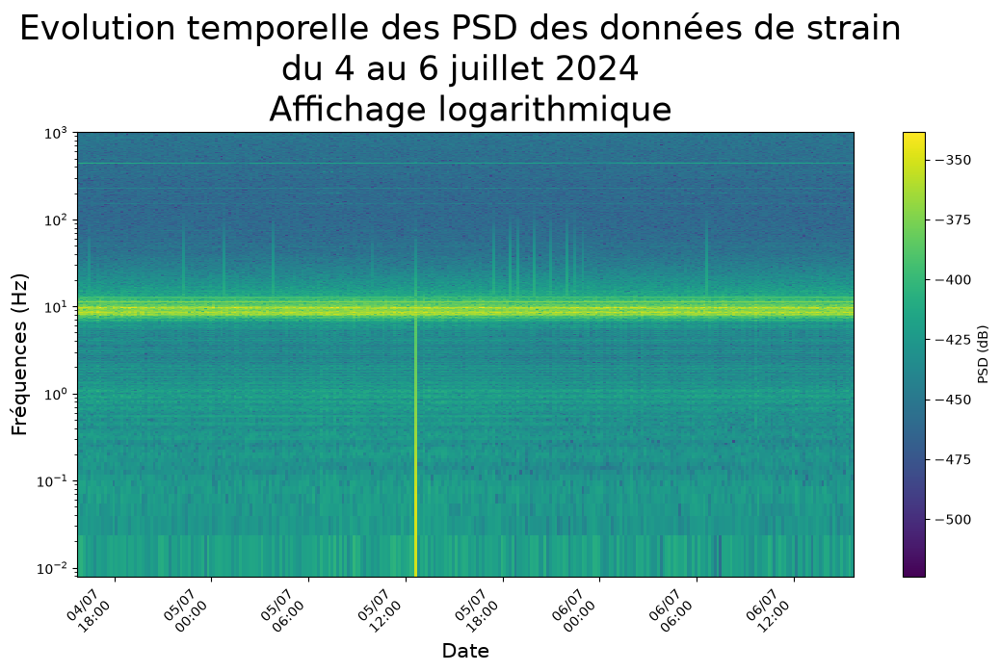

In [8]:
fct.spec_plot_strain(
    psd,
    dates,
    freqs,title="Evolution temporelle des PSD des données de strain \ndu 4 au 6 juillet 2024 \n Affichage logarithmique",outfile="spec_strain_ete.png"
)

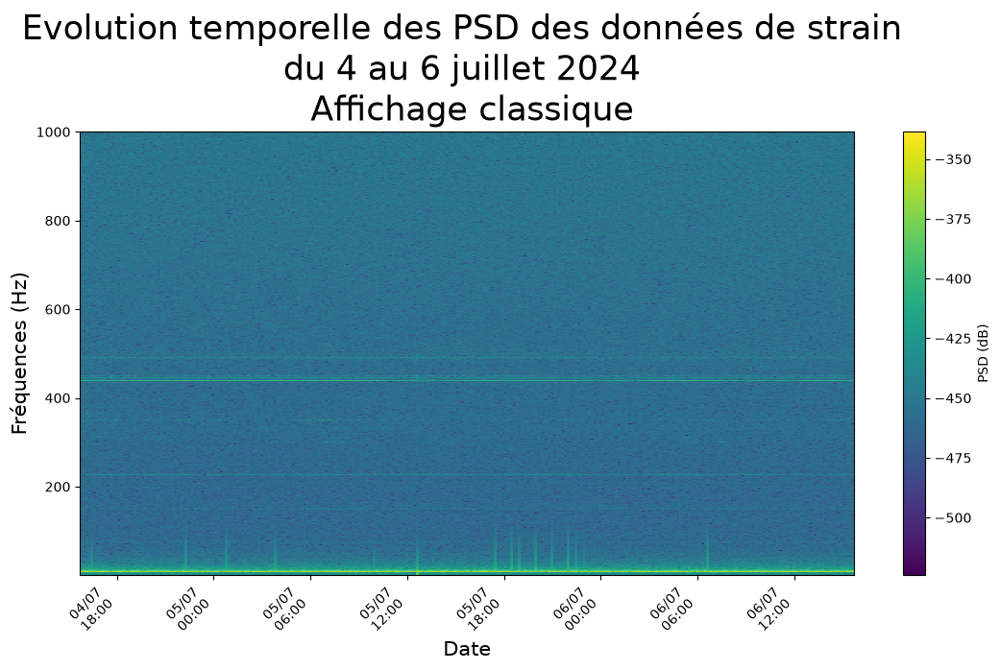

In [9]:
fct.spec_plot_strain(
    psd,
    dates,
    freqs,title="Evolution temporelle des PSD des données de strain \ndu 4 au 6 juillet 2024 \n Affichage classique",log=False,outfile="spec_strain_ete.png"
)

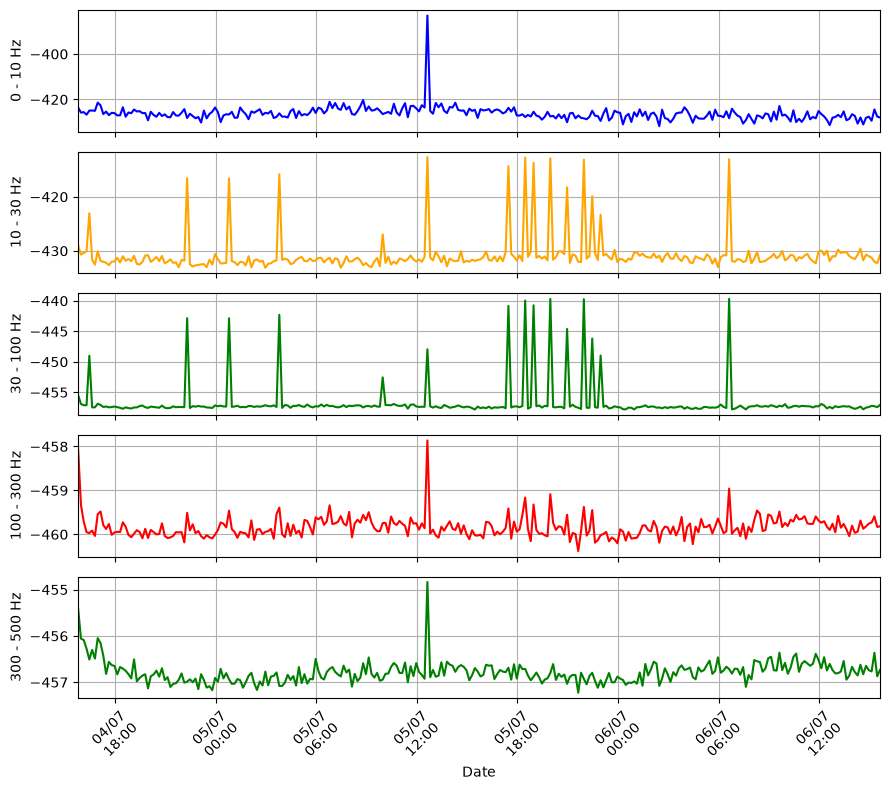

In [11]:
fct.median_4_strain(psd, dates, freqs,limx=None, we=False, eq = False, p=80 ,n=5,outfile="median_strain_ete.png")

## 13 au 15 décembre 2024

In [12]:
psd_d,dates_d,freqs_d=fct.load_psd_strain("psd_strain_1418140086_2j.npz")

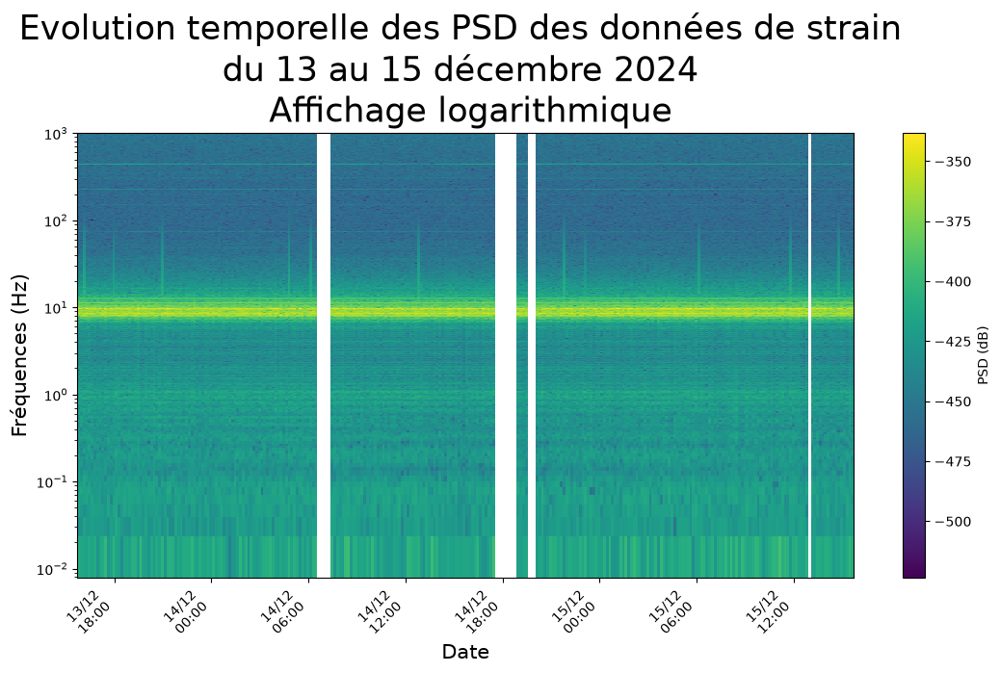

In [13]:
fct.spec_plot_strain(
    psd_d,
    dates_d,
    freqs_d,title="Evolution temporelle des PSD des données de strain \ndu 13 au 15 décembre 2024 \n Affichage logarithmique", log = True,outfile="spec_strain_hiver.png"
)

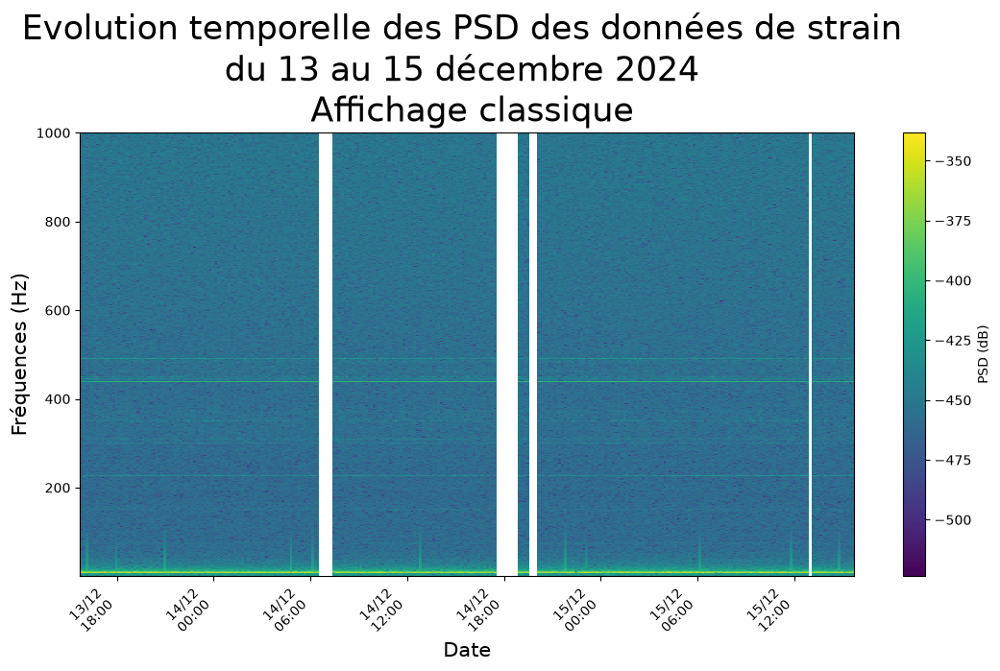

In [14]:
fct.spec_plot_strain(
    psd_d,
    dates_d,
    freqs_d,title="Evolution temporelle des PSD des données de strain \ndu 13 au 15 décembre 2024 \n Affichage classique", log = False,outfile="spec_strain_hiver.png"
)

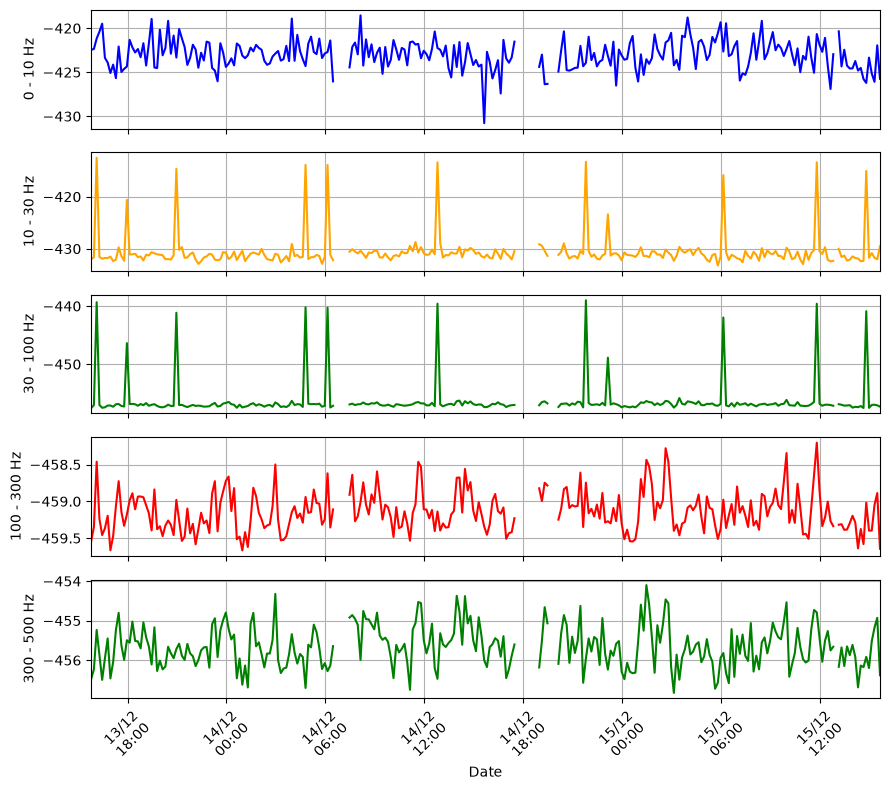

In [17]:
fct.median_4_strain(psd_d, dates_d, freqs_d,limx=None, we=False, eq = False, p=80 ,n=5,outfile="median_strain_hiver.png")